## Prototype for Fuzzy Logic Inference System (FIS): **Clyfar**
John R. Lawson, April 2024

This notebook was used as the backbone of the preprintat this [link](https://doi.org/10.20944/preprints202408.0185.v1).

Clyfar, Welsh for __clever__, is a NWP--AI hybrid system built on rulesets that take weather forecast data and produce best-guess and risk-based predictions of maximum ozone levels for the next 14 days. We intend to develop Clyfar continuously, with version 0.9 based on a fuzzy-logic inference system (FIS). This is a more fundamental AI rule-based model, and future versions may implement more complex models such as neural networks. However, with experimental branches of Clyfar, we can test different configurations before freezing a version for the Winter Ozone Alert program guidence. 

In this prototype study, we create a toy model to demonstrate its functionality in predicting winter-ozone atmospheric concentrations in the Uinta Basin, Utah. We show ways of delivering and evaluating both "best-guess" and risk-based predictions. Instead of using purely probabilities for communicating uncertainty, we present the idea of **possibility** and **necessity** of ozone-level alert levels such as "background", "elevated", and "high". The benefit over probabilities is the ability to communicate an uncertainty of the uncertainty predictions, which is important where data is sparse. (The bit about coin flips 50% being different from predicting a record breaking event, or Bayesian naivity, for instance). The long-term goal is optimising rulesets etc and progressing to a neural network model.

The framework is:
* Identify key input variables (snow, pressure, wind, solar radiation,
* Set ranges for each input variable (e.g., snowfall 0 to 10)
* Form logical rules (e.g., IF snow = "negligible" THEN ozone = "background")
* Inference with Mamdani method (more explainable)
  - Evolution to Sugeno method (extension to neural networks)
* Defuzzification, converting fuzzy (uncertain) output to one value and/or possibility--necessity distribution
* Validation and eventually tuning parameters

TO DO:
* Do we remove necessity entirely or have it computed after prob distr. is normalised?
* Make figures more "original"
* 

In [2]:
import calendar
import os
import io
from urllib.request import urlopen, Request

import numpy as np
import pandas as pd
from scipy.stats import entropy
import skfuzzy as fuzz
from skfuzzy import control as ctrl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.patches as patches
import matplotlib.patheffects as pe
import cartopy
import cartopy.geodesic as cgeo
import cartopy.crs as ccrs
import cartopy.io.img_tiles as cimgt
from PIL import Image
import shapely
import cartopy.feature as cfeature

# import synoptic.services as ss
from synoptic.services import stations_latest
from synoptic.services import stations_metadata

# Use latex for all figure text
plt.rc('text', usetex=True)
# Set font for latex
plt.rc('font', family='serif', size=12)
# Make maths rendering from latex use a modern latex inbuilt font
plt.rc('mathtext', fontset='cm')

plt.rcParams['figure.dpi'] = 300

y = 2022

In [3]:
def range_from_gaussian_params(centres_dict, sigma_dict) -> dict:
    """From dicts of Gaussian-curve centres and sigma value, return approximate ranges.
    
    Usage:
        For each category, we look up the values. Then we compute the range spanning the ~IQR.
        We round the range to the nearest multiple of 5 to make it more accessible,
        
    Args:
        - centres_dict: dict with category names as keys; centre of the Gaussian curve as values
        - sigma_dict: dict with category names as keys; sigma value of the Gaussian curve as values
        
    Returns:
        - range_dict: dict with category names as keys; range as tuple
    """
    range_dict = {}
    for cat, centre in centres_dict.items():
        sigma = sigma_dict[cat]
        # Round the following to the nearest multiple of 5.
        lower_raw = centre - 2.0 * sigma
        upper_raw = centre + 2.0 * sigma
        lower = 5 * round(lower_raw / 5)
        upper = 5 * round(upper_raw / 5)
        
        range_dict[cat] = [lower, upper]
        
    return range_dict
    

In [4]:
def generate_str_from_range(range_dict):
    """Generate a string from a dictionary of ranges.
    
    Usage:
        We  create a string similar to "~45--60 ppb" that is latex-friendly, per category (key).
        
    Args:
        - range_dict: dict with category names as keys; range as tuple
    """
    range_str_dict = {}
    for cat, (lower, upper) in range_dict.items():
        approx_str = r'$\approx$'
        range_str_dict[cat] = f"{approx_str}{lower:.0f}--{upper:.0f} ppb"
    return range_str_dict

In [5]:
def maybe_amend_year(month, year):
    year = year-1 if month == "Dec" else year
    return year

In [6]:
def plot_possibility_necessity(df_rep, ozone, month, day, range_dict=None, range_str_dict=None, percentiles=None, compute_necessity=False,
                                    normalise=False):
    
    # Convert month name to month number
    month_num = list(calendar.month_abbr).index(month[:3].capitalize())

    fig, ax = plt.subplots(1, 1, figsize=(12, 8), dpi=300)

    # Define categories
    categories = ['background', 'moderate', 'elevated', 'extreme']

    # Fetch value of ozone (actual and predicted) for this month/day row
    # Find the values in in df_rep
    max_ozone = df_rep[(df_rep.index.month == month_num) & (df_rep.index.day == day
                                )]['ozone_concentration'].max()
    
    # In the top-centre, annotate the maximum ozone concentration (ppv) for the day
    ax.text(0.5, 0.95, f'Observed Ozone: {max_ozone:.1f} ppb', transform=ax.transAxes, fontsize=12, ha='center')
    
    # Now look up the forecast ozone 
    forecast_ozone = df_rep[(df_rep.index.month == month_num) & (df_rep.index.day == day
                                )]['ozone_forecast'].max()
    
    # Under the observed value, annotate the forecast value
    ax.text(0.5, 0.9, f'Forecast Ozone: {forecast_ozone:.1f} ppb', transform=ax.transAxes, 
                        fontsize=12, ha='center')
    
    # Question: what would an ideal forecast (possibility/necessity distribution) look like?
    # Obvious answer is necessity and possibility being 1 for the observed value, 0 for others 
    # But how does a scalar value translate in reserve to a possibility/necessity distribution?
    
    # Create multiple curves that combine to create a centroid-defuzzified value that matched observed
    # Then we compare with the actual value 
    # This is a way to evaluate the forecast quality
    
        
    # Look up rows with the given month and day
    df_rep_date = df_rep[(df_rep.index.month == month_num) & (df_rep.index.day == day)]

    # Plot the possibility of each category
    sub_df = df_rep_date[['possibility_background', 'possibility_moderate',
                          'possibility_elevated', 'possibility_extreme']]
    
    # Normalize the values to ensure sup(possibility) = 1 ?
    if normalise:
        sub_df = do_normalization(sub_df)
    
    sub_vals = sub_df.values[0]
    ax.bar(categories, sub_vals, color=['blue', 'orange', 'green', 'red'])

    plt.xlabel("Ozone concentration Level (ppb)")
    plt.ylabel('Possibility')
    plt.ylim([0,1])

    # Create dictionary of category names and their centre of bar
    x_loc = {cat: i for i, cat in enumerate(categories)}

    if compute_necessity:
        necessity_array = compute_necessity_distr(np.array(sub_vals), func="max")
        # necessity_array, rescale_dkl = compute_necessity_distr(np.array(sub_vals), func="max", normalize=True)
    
        # Add a horizontal line for necessity of each category
        for i, cat in enumerate(ozone.terms.keys()):
            labl = "Necessity" if i == 0 else ""
            plt.plot(x_loc[cat], necessity_array[i], marker='_', markersize=22,
                            label=labl, zorder=10,
                            markeredgecolor='orchid', markeredgewidth=4)
            
    if range_str_dict is not None:
        # For each category, annotate the corresponding Gaussian curve centre with the suffix "ppb".
        for i, (cat, centre) in enumerate(curve_centres.items()):
            y_pos = sub_vals[i]
            
            if (y_pos + 0.17) > 0.8:
                y_pos = y_pos - 0.1
            else:
                y_pos = y_pos + 0.1
            
            
            ax.text(x_loc[cat], y_pos, range_str_dict[cat], ha='center', fontsize=13)
            # ax.text(x_loc[cat], necessity_array[i]+0.05, range_str_dict[cat], ha='center', fontsize=13)
            
    # TODO: putting the observed and forecast values of ozone into each category range
    # For each category, True or False that the ozone value (observed and forecast) is within that range
    
    obs_range_list = []
    forecast_range_list = []
    
    if range_dict is not None:
        for cat, (lower, upper) in range_dict.items():
            # For each category, check if the observed and forecast values are within the range
            obs_in_range = lower <= max_ozone <= upper
            obs_range_list.append(obs_in_range)
            
            forecast_in_range = lower <= forecast_ozone <= upper
            forecast_range_list.append(forecast_in_range)
        
        # Create dataframe with each category and whether the observed and forecast values are in the range
        range_df = pd.DataFrame(index=range_dict.keys())
        range_df['observed_in_range'] = obs_range_list
        range_df['forecast_in_range'] = forecast_range_list
        
        # TODO: better way of annotating/showing this!
        # For each category, if the observed value is in the range, annotate "O"
        # If the forecast value is in the range, annotate "F" 
        for i, cat in enumerate(categories):
            if range_df.loc[cat, 'observed_in_range']:
                ax.text(x_loc[cat], 0.62, 'O', ha='center', fontsize=13)
            if range_df.loc[cat, 'forecast_in_range']:
                ax.text(x_loc[cat], 0.54, 'F', ha='center', fontsize=13)
    
    # TODO: Annotate the percentile for each category possibility in the climatology to show anomalies
    # This is a warning that the forecast is not typical 
    # Can give return periods for, e.g., exceeding 90th percentile of climatology
    # In years - for instance, a 1 in 10 year event for "extreme" possibility to be 0.5
    
    # TODO: eventually, in operations, the climatology must be retrained often with all winters in archive
    
    if percentiles is not None:
        for i, cat in enumerate(categories):
            col_name = f'possibility_{cat}'
            math_str = r'\%'
            y_pos = sub_vals[i]
            pc_val = int(100*percentiles[col_name])
            
            # If percentile is over 50%, subtract from 100% and state "bottom x%" instead
            top_str = 'Top' if pc_val > 50 else 'Bottom'
            pc_display_val = 100 - pc_val if pc_val > 50 else pc_val
            
            # Then to avoid 0% we bound pc_display_val to [1,99]
            pc_display_val = max(1, min(99, pc_display_val))

            plot_str = f'Rank: {top_str} {pc_display_val:d}{math_str}'
                        
            if (y_pos + 0.17) > 0.8:
                y_pos = y_pos - 0.17
            else:
                y_pos = y_pos + 0.17
                
            ax.text(x_loc[cat], y_pos, plot_str, 
                    ha='center', fontsize=13, color='black',
                    bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))    
            
    plt.tight_layout()
    plt.show()

In [7]:
def select_function(func):
    if func == "max":
        f = np.max
    elif func == "mean":
        f = np.mean
    else:
        raise ValueError("func must be 'max' or 'mean'")
    return f

def compute_kl_divergence(p, q, min_val=1e-3, max_val=1-(1e-3)):
    """Compute Kullback-Leibler divergence between two distributions.
    
    p represents an original or "truth". q represents an approximation or "model".
    
    min_val and max_val are used to clip the distributions to avoid log(0) and division by zero.
    """
    # Ensure values are clipped to avoid log(0) and division by zero
    # But also limit to a reasonable possibility value (min_val and max_val) humans might issue
    p = np.clip(p, min_val, max_val)
    q = np.clip(q, min_val, max_val)
    
    return np.sum(p * np.log(p / q))

def compute_necessity_distr(possibility_array, func="max",):
    """Compute necessity distribution from a possibility distribution.
    
    Necessity of an event is 1 - maximum possibility of the not-event (complement).
    
    If normalize is True, rescale linearly the possibility array to ensure sup(possibility) = 1.
    """
    f = select_function(func)
    necessity_array = []
    n_categories = len(possibility_array)

    for i in range(n_categories):
        other_possibilities = [possibility_array[j] for j in range(n_categories) if j != i]
        necessity_array.append(1 - f(other_possibilities))
    return np.array(necessity_array)

In [8]:
def do_normalization(possibility_array):
    # Rescale the possibility array to ensure sup(possibility) = 1
    # Not sure what axis! 
    possibility_array_norm = possibility_array / np.max(possibility_array)
    return possibility_array_norm

In [9]:
def create_possibility_array(ozone_simulation, ozone, normalize=False):
    possibility_array = np.array([k.membership_value[ozone_simulation] for k in ozone.terms.values()])
    if normalize:
        print("Normalizing")
        possibility_array = do_normalization(possibility_array) 
    return possibility_array

In [10]:
def create_dataframe_poss_necess(category_names, possibility_array, necessity_array, 
                                    rescale_dkl=None):
    # Create a dataframe where rows are category names and columns are possibility and necessity
    df = pd.DataFrame(index=category_names)
    df['possibility'] = possibility_array
    df['necessity'] = necessity_array
    if rescale_dkl is not None:
        df['rescale_dkl'] = rescale_dkl
    return df

In [11]:
# From this we can compute necessity per category using the max of the other categories 
def compute_possibility_necessity_df(ozone_simulation, ozone, normalize=False):
    possibility_array = create_possibility_array(ozone_simulation, ozone, normalize=normalize)
    necessity_array = compute_necessity_distr(possibility_array, func="max",)
    # necessity_array, rescale_dkl = compute_necessity_distr(possibility_array, func="max", normalize=True)
    poss_necess_df = create_dataframe_poss_necess(ozone.terms.keys(), possibility_array, necessity_array,)# dkl=rescale_dkl)
    return poss_necess_df

In [12]:
def plot_ozone_fcst(ozone, sim=None, df=None, category_curve_centre=None, plot_necessity=False):
    """
    Plot the ozone forecast with the possibility and necessity of each category
    
    Args:
        - category_curve_centre: dict with category names as keys; centre of the Gaussian curve as values
    """
    # TODO: use explicit values to plot without using view(). 
    # TODO: Can then fetch a crisp value with box/whisker ranges from the aggregated result.
    
    ozone.view(sim=sim)
    
    # The current figure has an x-axis of ozone concentration and y-axis of membership
    
    if df is not None:
        # df is a dataframe with columns of possibility and necessity for each category
        # the df index is the category names
        
        for i, cat in enumerate(ozone.terms.keys()):
            # For each category, plot a star at each of these positions:
            # The x-axis value is that which corresponds with where y is maximum for that category
            # These membership functions are all Gaussian cuves
            # So the x-axis value is the centre of the curve from the list category_curve_centre
            # then y position is the necessity value of that category  
            
            if plot_necessity:
                # The label is only one for i=0 to make sure it's not repeated in the legend 
                labl = "Necessity" if i == 0 else ""
                plt.plot(category_curve_centre[cat], df.loc[cat, 'necessity'], marker='_', markersize=22, 
                            label=labl, zorder=10, 
                            markeredgecolor='orchid', markeredgewidth=4)

    # Drawing a dotted line at x=35 ppb and labeling it as "typical background"
    plt.axvline(x=40, color='k', linestyle=':', linewidth=1.5)
    plt.text(38, 0.85, 'Typical\nBackground', horizontalalignment='right', 
             fontdict={'fontsize': 8})
    
    # Drawing a line at x=70 ppb and labeling "NAAQS for Ozone"
    plt.axvline(x=70, color='magenta', linestyle=':', linewidth=1.5)
    plt.text(72, 0.85, 'NAAQS for Ozone', horizontalalignment='left',
            fontdict={'fontsize': 8})


    plt.xlabel('Ozone Concentration (ppb)')

    plt.ylim(0, 1)
    
    # Add to the legend the dotted line meaning "Concentrations"
    # Also a 

    plt.legend()

    plt.show()

In [13]:
def plot_ozone_permutations():
    fig, ax = plt.subplots(3, 3, figsize=(18, 18), dpi=300)

    # Define data and titles
    data = [
        (['background', 'moderate', 'elevated', 'extreme'], [0.13, 0.11, 0.91, 0.07], 'High possibility and high necessity for elevated ozone'),
        (['background', 'moderate', 'elevated', 'extreme'], [0.15, 0.25, 0.9, 0.5], 'High possibility and medium necessity for elevated ozone'),
        (['background', 'moderate', 'elevated', 'extreme'], [0.2, 0.4, 0.9, 0.75], 'High possibility and low necessity for elevated ozone'),
        (['background', 'moderate', 'elevated', 'extreme'], [0.08, 0.1, 0.53, 0.18], 'Medium possibility and high necessity for elevated ozone'),
        (['background', 'moderate', 'elevated', 'extreme'], [0.35, 0.45, 0.49, 0.25], 'Medium possibility and medium necessity for elevated ozone'),
        (['background', 'moderate', 'elevated', 'extreme'], [0.4, 0.5, 0.51, 0.88], 'Medium possibility and low necessity for elevated ozone'),
        (['background', 'moderate', 'elevated', 'extreme'], [0.19, 0.1, 0.1, 0.2], 'Low possibility and high necessity for elevated ozone'),
        (['background', 'moderate', 'elevated', 'extreme'], [0.57, 0.2, 0.15, 0.14], 'Low possibility and medium necessity for elevated ozone'),
        (['background', 'moderate', 'elevated', 'extreme'], [0.9, 0.3, 0.14, 0.15], 'Low possibility and low necessity for elevated ozone'),
    ]

    # Plot each subplot
    for i, (categories, values, title) in enumerate(data):
        row = i // 3
        col = i % 3
        ax[row, col].bar(categories, values, color=['darkblue', 'darkblue', 'darkgoldenrod', 'darkblue'])
        ax[row, col].set_title(title)
        ax[row, col].text(0.05, 0.95, f'({chr(97 + i)})', transform=ax[row, col].transAxes, fontsize=16, va='top')
        ax[row, col].set_ylim(0, 1)

    plt.tight_layout()
    plt.show()


In [14]:

projpath = '..'

def osm_image(lon,lat,sitename='UB',radius=1E3*72, snow_latlons=None, factor=1.3):
    assert snow_latlons is not None 
    cimgt.QuadtreeTiles.get_image = image_spoof # reformat web request - map spoofing
    img = cimgt.QuadtreeTiles() # spoofed, downloaded street map
    stroke = [pe.Stroke(linewidth=1, foreground='w'), pe.Normal()]


    fig = plt.figure(figsize=(8,8)) 
    ax = plt.axes(projection=img.crs) # project using coordinate reference system (CRS) 
    data_crs = ccrs.PlateCarree()

    # auto-calculate scale
    scale = int(120/np.log(radius))
    scale = (scale<20) and scale or 19

    # or change scale manually - https://www.theurbanist.com.au/
    # NOTE: scale specifications should be selected based on radius
    # but be careful not have both large scale (>16) and large radius (>1000), 
    #  it is forbidden under [OSM policies](https://operations.osmfoundation.org/policies/tiles/)
    # -- 2     = coarse image, select for worldwide or continental scales
    # -- 4-6   = medium coarseness, select for countries and larger states
    # -- 6-10  = medium fineness, select for smaller states, regions, and cities
    # -- 10-12 = fine image, select for city boundaries and zip codes
    # -- 14+   = extremely fine image, select for roads, blocks, buildings

    extent = calc_extent(lon,lat,radius*factor)
    ax.set_extent(extent) # set extents
    ax.add_image(img, int(scale)) # add OSM with zoom specification

    # add site
    ax.plot(lon,lat, color='black', marker='x', ms=7, mew=3, transform=data_crs)
    ax.plot(lon,lat, color='red', marker='x', ms=6, mew=2, transform=data_crs)

    # rand_lon = cgeo.Geodesic().direct((lon,lat),rand_azimuths_deg,rand_distances)[:,0]
    # rand_lat = cgeo.Geodesic().direct((lon,lat),rand_azimuths_deg,rand_distances)[:,1]

    # ax.plot(-110.0, 45.0,color='black',lw=0,marker='x',ms=4.5,mew=1.0,transform=data_crs)
    # ax.plot(rand_lon,rand_lat,color='yellow',lw=0,marker='x',ms=4,mew=0.5,transform=data_crs)

    # add cartopy geodesic circle
    circle_points = cgeo.Geodesic().circle(lon=lon, lat=lat, radius=radius)
    geom = shapely.geometry.Polygon(circle_points)
    ax.add_geometries((geom,), crs=ccrs.PlateCarree(), edgecolor='red', facecolor='none', linewidth=2.5)

    radius_text = cgeo.Geodesic().direct(points=(lon,lat),azimuths=30,distances=radius)[:,0:2][0]
    stroke = [pe.Stroke(linewidth=1.5, foreground='w'), pe.Normal()]
    
    ax.text(radius_text[0], radius_text[1], f'r={int(radius/1000):d} km', color='red', 
        fontsize=16, ha='left', va='bottom', path_effects=stroke, transform=data_crs,
            fontweight='bold', bbox=dict(facecolor='white', alpha=0.5))  
    
    # ax.text(radius_text[0],radius_text[1],f'r={radius} m', color='red', 
    #     fontsize=8, ha='left',va='bottom', path_effects=stroke, transform=data_crs)

    # gl = ax.gridlines(draw_labels=True, crs=data_crs,
    #                     color='k',lw=0.5)
    # gl.top_labels = False
    # gl.right_labels = False
    # gl.xformatter = cartopy.mpl.gridliner.LONGITUDE_FORMATTER
    # gl.yformatter = cartopy.mpl.gridliner.LATITUDE_FORMATTER

    towns = [
            {'name': 'Vernal', 'lat': 40.455, 'lon': -109.528},
            {'name': 'Roosevelt', 'lat': 40.297, 'lon': -109.988},
            # {'name': 'Salt Lake City', 'lat': 40.758701, 'lon': -111.876183}, # Too far lol
            {'name': 'Ouray', 'lat': 40.1000, 'lon': -109.6333},
            {'name': 'Dinosaur', 'lat': 40.2411, 'lon': -109.0065},
            {'name': 'Duchesne', 'lat': 40.1633, 'lon': -110.4021},
            {'name': 'Kings Peak', 'lat': 40.7764, 'lon': -110.3729}
            ]
    
    for town in towns:
        ax.plot(town['lon'], town['lat'], color='blue', marker='o', ms=5, mew=1,   
                transform=data_crs)
        ax.text(town['lon'] + 0.035, town['lat'] + 0.035, town['name'], 
                color='blue', fontsize=9, ha='left', va='bottom', 
                transform=data_crs, bbox=dict(facecolor='white', alpha=0.5)) 


    for snow in snow_latlons:
        ax.plot(snow['lon'], snow['lat'], color='black', marker='s', ms=5, 
                mew=1, transform=data_crs)
        ax.text(snow['lon'] - 0.035, snow['lat'] - 0.04, snow['name'], 
                color='black', fontsize=9, ha='right', va='bottom',
                transform=data_crs, bbox=dict(facecolor='white', alpha=0.5))

    # Dictionary of mountain ranges
    mountain_ranges = [
        {'name': 'Uinta Mountains', 'lat': 40.6, 'lon': -109.99},
        # {'name': 'Roan Cliffs', 'lat': 39.8, 'lon': -109.5},
        {'name': 'Roan and Book Cliffs', 'lat': 39.8, 'lon': -109.5},
        # {'name': 'Douglas Creek Arch', 'lat': 39.7, 'lon': -108.8},
        {'name': 'Wasatch Range', 'lat': 40.2, 'lon': -110.75}  # For arrow
    ]
    
    # Loop to add text and arrow for mountain ranges
    for range in mountain_ranges:
        # if range['name'] == 'Wasatch Range':
        #     ax.annotate(range['name'], xy=(range['lon'], range['lat']), xytext=(range['lon'] - 1, range['lat']),
        #                 arrowprops=dict(facecolor='black', shrink=0.05), color='black', fontsize=18, fontstyle='italic',
        #                 ha='left', transform=data_crs, bbox=dict(facecolor='cyan', alpha=0.5))
        # else:
        ax.text(range['lon'], range['lat'], range['name'], color='black', fontsize=18, fontstyle='italic', ha='center', 
                transform=data_crs, bbox=dict(facecolor='cyan', alpha=0.5))
    # Key mountain ranges            
    # ax.text(-109.99, 40.6, 'UINTA MOUNTAINS', color='black', fontsize=18, fontstyle='italic', ha='center', 
    #             transform=data_crs, bbox=dict(facecolor='cyan', alpha=0.5))

    ax.add_feature(cfeature.RIVERS, linewidth=1.0, edgecolor='darkcyan')  # Add rivers
    ax.add_feature(cfeature.STATES, linewidth=1.0, edgecolor='black')  # Add state boundaries
    ax.add_feature(cfeature.BORDERS, linewidth=1.0, edgecolor='black')  # Add county boundaries

    # fig.savefig(f'{projpath}/{sitename}_satellite_r{radius}_highres.jpg', dpi=250, bbox_inches='tight')

    return

def calc_extent(lon,lat,dist):
    '''This function calculates extent of map
    Inputs:
        lat,lon: location in degrees
        dist: dist to edge from centre
    '''

    dist_cnr = np.sqrt(2*dist**2)
    top_left = cgeo.Geodesic().direct(points=(lon,lat),azimuths=-45,distances=dist_cnr)[:,0:2][0]
    bot_right = cgeo.Geodesic().direct(points=(lon,lat),azimuths=135,distances=dist_cnr)[:,0:2][0]

    extent = [top_left[0], bot_right[0], bot_right[1], top_left[1]]

    return extent

def image_spoof(self, tile):
    '''this function reformats web requests from OSM for cartopy
    Heavily based on code by Joshua Hrisko at:
        https://makersportal.com/blog/2020/4/24/geographic-visualizations-in-python-with-cartopy'''

    url = self._image_url(tile)                # get the url of the street map API
    req = Request(url)                         # start request
    req.add_header('User-agent','Anaconda 3')  # add user agent to request
    fh = urlopen(req) 
    im_data = io.BytesIO(fh.read())            # get image
    fh.close()                                 # close url
    img = Image.open(im_data)                  # open image with PIL
    img = img.convert(self.desired_tile_form)  # set image format
    return img, self.tileextent(tile), 'lower' # reformat for cartopy        

def plot_satellite():
    # Centre of map - UCL21!
    # Pelican Lake weather station
    cen_lat = 40.17422
    cen_lon = -109.66659
    
    snow_stids = ["COOPALMU1", "COOPDINU1", "COOPDSNU1", "COOPJENU1", "COOPMYTU1", "COOPNELU1", "COOPVELU1"]
    # vars = ["latitude","longitude","snow_depth"]
    vars = ["snow_depth",]

    df = stations_metadata(radius="UCL21,45", recent=10000)

    # Remove all columns that end in "date_time" as they are not needed
    # and break the plotting code 
    # df = df.loc[:, ~df.columns.str.endswith("date_time")]

    snow_latlons = []
    # Look up the lat/lon of these stations
    for stid in snow_stids:
        lat = df.loc["latitude", stid]
        lon = df.loc["longitude", stid]
        snow_latlons.append({'name': stid, 'lat': lat, 'lon': lon})
        
    osm_image(cen_lon, cen_lat, snow_latlons=snow_latlons)

    return

Checking for data recent=10000 minutes.

 🚚💨 Speedy Delivery from Synoptic API [metadata]: https://api.synopticdata.com/v2/stations/metadata?radius=UCL21,45&recent=10000&token=🙈HIDDEN



/Users/johnlawson/anaconda3/envs/clyfar/lib/python3.11/site-packages/synoptic/services.py:525: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  df = df.apply(pd.to_numeric, errors="ignore")


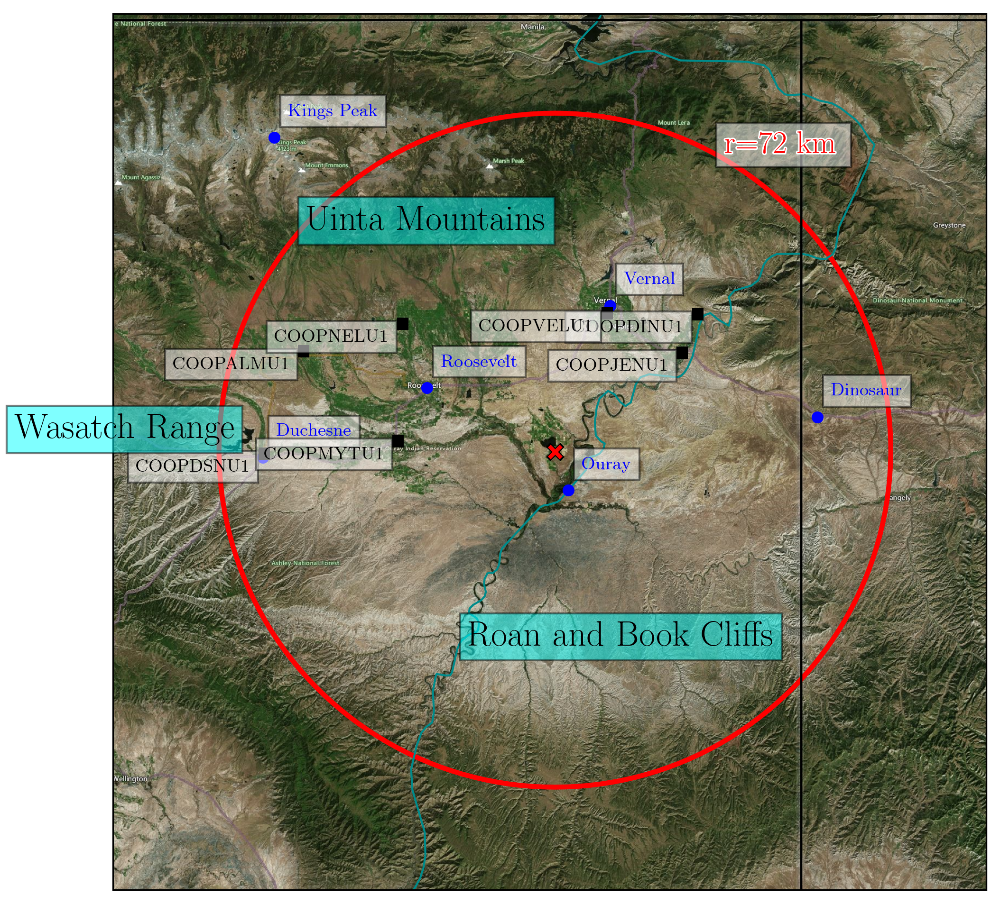

In [15]:
plot_satellite()

### Define input variables and universes of discourse
We will create a toy model using these four input variables that represent the Uinta Basin (feature-engineered from weather stations in the Basin). The variables, with approximate ranges, are:
* Snowfall (mm) - depth but could be percent coverage
  - Negligible (0-75 mm)
  - Sufficent (75 mm - 400 mm+)
* Pressure (hPa)
  - Low (980-1000 hPa)
  - Medium (1000-1020 hPa) 
  - High (1020 hPa+) 
* Wind speed (m/s)
  - Calm (0-4 m/s)
  - Breezy (4+ m/s) 
* Solar radiation (W/m^2) - Not sure if we choose percent of max, time of year, etc
  - Low (0-400 W/m^2) (cloudy OR winter?)
  - Medium (400-700 W/m^2) (clear OR not winter?)
  - High (700+ W/m^2) (clear OR not winter?)

There are some potential future variables such as:
* Temperature (C)
* Max ozone the previous day (ppb)
* Time of year (sine/cosine of day of year)
* Percent of maximum downwelling solar radiation
* Soil moisture
* Humidity (evaporation; ozone chemistry; optical depth)
* Wind direction (snow drift; ozone transport)
* Snow-water equivalent (drifting snow; evaporation; snow depth)

Our target variable is:
* Today's max Ozone (ppb)

In natural language, we can say for the UB Winter Ozone system:
1. If there is no or little snow, then the ozone will be background. 
2. If there is sufficient snow, and the pressure is high, and the wind is calm, and the solar radiation is medium-to-high, then the ozone will be high. (worst case)
3. If there is sufficient snow, and the pressure is high, and the wind is calm, and the solar radiation is low, then the ozone will be elevated. (mid-winter worst case)
4. If there is sufficient snow, and the pressure is medium, and the wind is calm, and the solar radiation is low, then the ozone will be elevated. (wind a little high; sun a little weak)
5. If the pressure is low, or wind is breezy, ozone will be background (regardless of snow, wind or lowering pressure gives a low-ozone scenario)
6. If the solar radiation is high, then the ozone will be background (outside of winter)

We can construct rulesets as follows: (there is no NOT ¬ yet)
1. IF (snow = "negligible") ==> ozone = "background"
2. IF (snow = "sufficient") ∧ (pressure = "high") ∧ (wind = "calm") ∧ ((solar = "low") ∨ (solar = "medium")  ==> ozone = "high"
3. IF (snow = "sufficient") ∧ (pressure = "high") ∧ (wind = "calm") ∧ (solar = "low") ==> ozone = "elevated"
4. IF (snow = "sufficient") ∧ (pressure = "medium") ∧ (wind = "calm") ∧ (solar = "low") ==> ozone = "elevated"
5. IF ((pressure = "low") ∨ (wind = "breezy")) ==> ozone = "background"
6. IF (solar = "high") ==> ozone = "background" (outside of winter)


### Key weather stations
* Fort Duchesne UINU1 has good solar radiation data
  - 550 max in early Nov; 100-200 on cloudy day
  - 450 max in early Dec; 200 on cloudy day
  - 500 max in early Jan; 150-250 on cloudy day
  - 600 max in early Feb; 200 on cloudy day 
  - 800 W/m^2 max in early March; 200-300 on cloudy day

## Universe of discourse
For each input variable, we need to define the universe of discourse. This is the range of values that each variable can take.  We will use the following ranges:

In [16]:
# Universes of discourses per variable, in metric units
# Define universe of discourse ranges

# Snow in mm up to 750 mm (3 foot)
snow_uod = np.arange(0, 750, 5)

# mslp using our stations has a bias/error but whatever
# mslp_uod = np.arange(970, 1040, 1)
mslp_uod = np.arange(1000E2, 1070E2, 0.5E2)

# Wind has sigmoid. m/s 
wind_uod = np.arange(0, 20, 0.125)

# Solar 
solar_uod = np.arange(100, 1100, 10)

# Use the defined ranges in the Antecedent function
snow = ctrl.Antecedent(snow_uod, 'snow')
mslp = ctrl.Antecedent(mslp_uod, 'mslp')
wind = ctrl.Antecedent(wind_uod, 'wind')
solar = ctrl.Antecedent(solar_uod, 'solar')

# TODO: solar might combine stations via percentile of all per day, maybe per hour, THEN nzm

# Output variable
ozone = ctrl.Consequent(np.arange(20, 140, 1), 'ozone')


/Users/johnlawson/anaconda3/envs/clyfar/lib/python3.11/site-packages/skfuzzy/control/fuzzyvariable.py:125: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


TypeError: cannot unpack non-iterable NoneType object

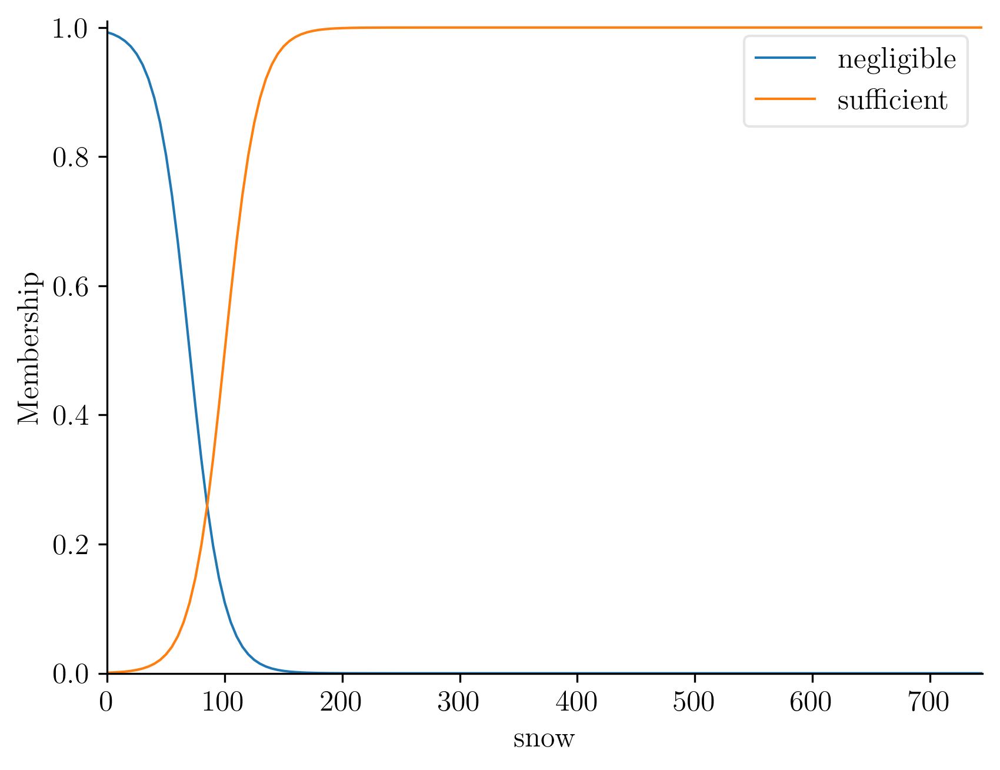

In [17]:
# Membership functions for each snow 
snow['negligible'] = fuzz.sigmf(snow.universe, 70, -0.07)
snow['sufficient'] = fuzz.sigmf(snow.universe, 100, 0.07)

# fig,ax = snow["negligible"].view()
fig,ax = snow.view(figsize=(10,10), dpi=300)
ax.set_xlabel("Snow depth (mm)")

Text(1.0, 0, '')

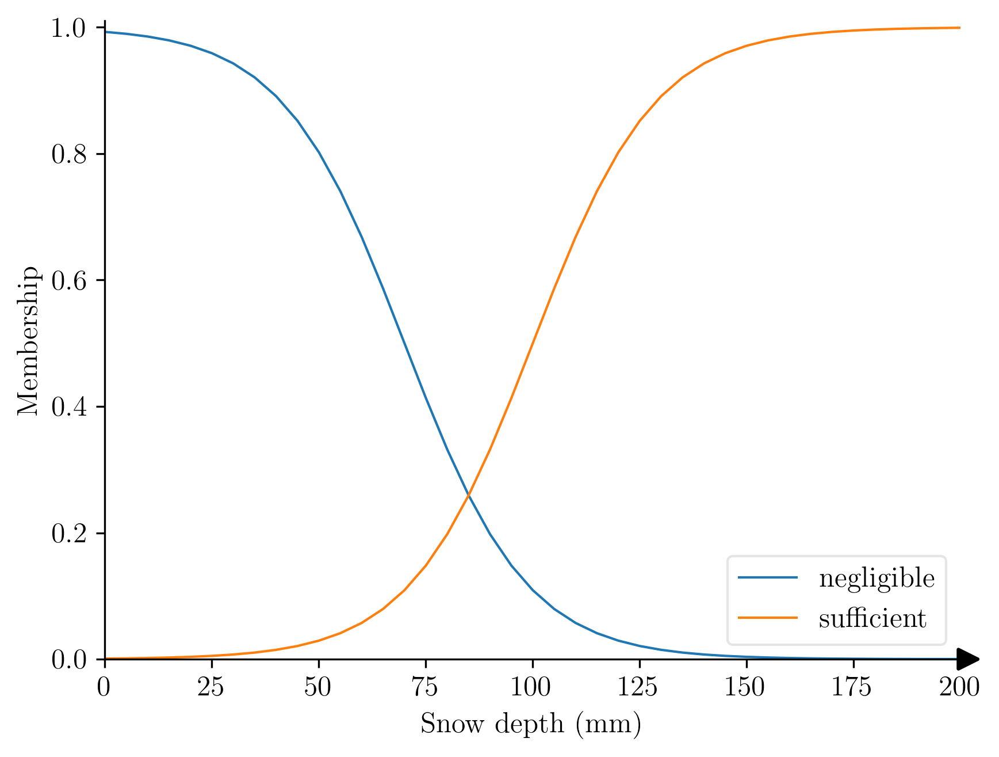

In [17]:
# Create another version of the last plot, but with a restricted x-axis zoomed in the range [0,200]
# Also show a symbol on the x-axis to indict this is a shortened x axis.

fig,ax = snow.view(figsize=(10,10), dpi=300)
ax.set_xlim(0, 200)
ax.set_xlabel("Snow depth (mm)")

ax.annotate('', xy=(1.03, 0), xytext=(1.0, 0),
            xycoords='axes fraction', textcoords='axes fraction',
            arrowprops=dict(arrowstyle="-|>", color='k', lw=1.5, mutation_scale=20))


In [18]:
dir(snow['negligible'])
snow['negligible'].mf


array([9.92608459e-01, 9.89543294e-01, 9.85225968e-01, 9.79163655e-01,
       9.70687769e-01, 9.58908722e-01, 9.42675824e-01, 9.20561451e-01,
       8.90903179e-01, 8.51952802e-01, 8.02183889e-01, 7.40774899e-01,
       6.68187772e-01, 5.86617579e-01, 5.00000000e-01, 4.13382421e-01,
       3.31812228e-01, 2.59225101e-01, 1.97816111e-01, 1.48047198e-01,
       1.09096821e-01, 7.94385492e-02, 5.73241759e-02, 4.10912782e-02,
       2.93122308e-02, 2.08363445e-02, 1.47740317e-02, 1.04567062e-02,
       7.39154134e-03, 5.22012569e-03, 3.68423990e-03, 2.59906776e-03,
       1.83293894e-03, 1.29234978e-03, 9.11051194e-04, 6.42179701e-04,
       4.52622223e-04, 3.19000129e-04, 2.24816770e-04, 1.58436219e-04,
       1.11653341e-04, 7.86833737e-05, 5.54485247e-05, 3.90745548e-05,
       2.75356911e-05, 1.94042314e-05, 1.36740091e-05, 9.63595025e-06,
       6.79035870e-06, 4.78509449e-06, 3.37200386e-06, 2.37621333e-06,
       1.67449041e-06, 1.17999403e-06, 8.31528028e-07, 5.85968041e-07,
      

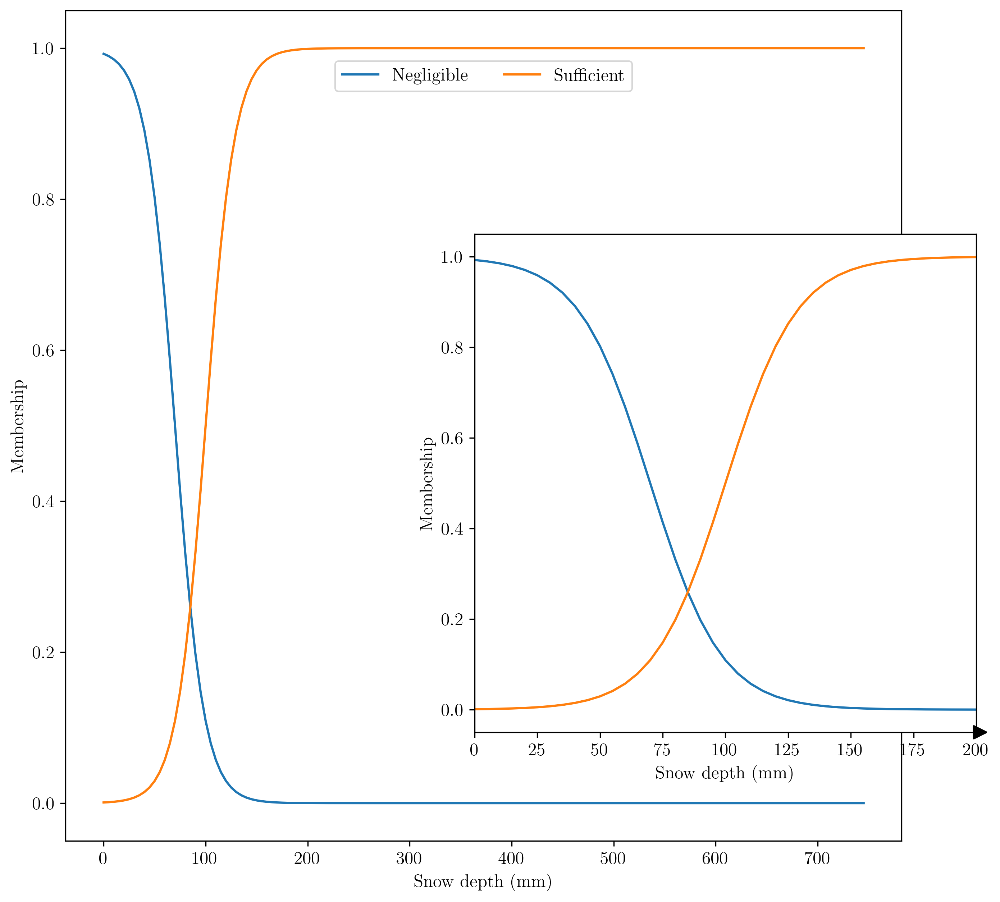

In [19]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# main plot
fig, ax_main = plt.subplots(figsize=(10, 10), dpi=300)
ax_main.plot(snow_uod, snow['negligible'].mf, label='Negligible')
ax_main.plot(snow_uod, snow['sufficient'].mf, label='Sufficient')
ax_main.set_xlabel("Snow depth (mm)")
ax_main.legend()

# Create inset plot with adjusted position and size
# Adjusting width and height to make the inset larger
# Adjusting bbox_to_anchor to move it further left and higher inside the main plot
ax_inset = inset_axes(ax_main, width="60%", height="60%", loc="lower right",
                      bbox_to_anchor=(0.1, 0.12, 1, 1), bbox_transform=ax_main.transAxes)
ax_inset.plot(snow_uod, snow['negligible'].mf)
ax_inset.plot(snow_uod, snow['sufficient'].mf)
ax_inset.set_xlim(0, 200)
ax_inset.set_xlabel("Snow depth (mm)")

# Adding the arrow at the end of the x-axis in the inset
ax_inset.annotate('', xy=(1.03, 0), xytext=(1.0, 0),
                  xycoords='axes fraction', textcoords='axes fraction',
                  arrowprops=dict(arrowstyle="-|>", color='k', lw=1.5, mutation_scale=20))
ax_inset.set_ylabel("Membership")
ax_main.set_ylabel("Membership")
ax_main.legend(loc='upper center', bbox_to_anchor=(0.5, 0.95), ncol=2)

plt.show()

Text(0.5, 0, 'Mean sea-level pressure (hPa)')

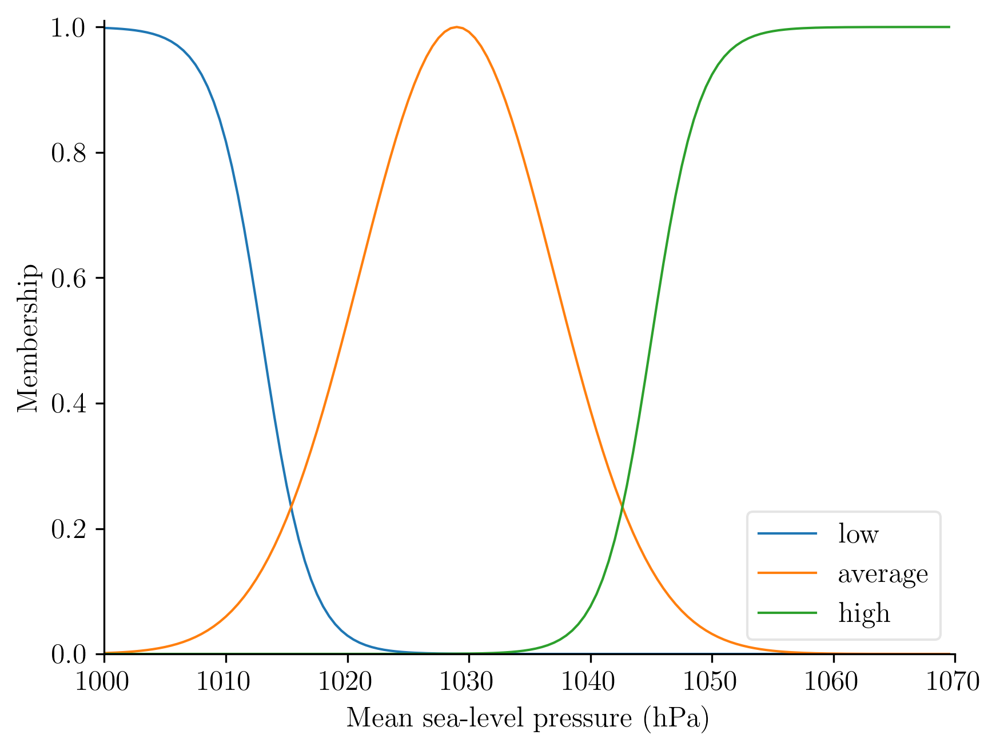

In [20]:
# Pressure (mslp, hPa)
# mslp['low'] = fuzz.sigmf(mslp.universe, 995, -0.2)
# mslp['average'] = fuzz.gaussmf(mslp.universe, 1005, 10)
# mslp['high'] = fuzz.sigmf(mslp.universe, 1015, 0.2)

mslp['low'] = fuzz.sigmf(mslp.universe, 1013E2, -0.005)
mslp['average'] = fuzz.gaussmf(mslp.universe, 1029E2, 8E2)
mslp['high'] = fuzz.sigmf(mslp.universe, 1045E2, 0.005)

fig,ax = mslp.view(figsize=(10,10), dpi=300)

# Set x-axis ticks and labels that are every 100 Pa but labelled as hPa (divided by 100 )
ax.set_xticks(np.arange(1000E2, 1075E2, 10E2))
ax.set_xticklabels(np.arange(1000, 1075, 10))

ax.set_xlabel("Mean sea-level pressure (hPa)")

/Users/johnlawson/UBWO-FIS/UBWO-FIS/skfuzzy/control/fuzzyvariable.py:125: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Text(0.5, 0, 'Wind speed ($m\\,s^{-2}$)')

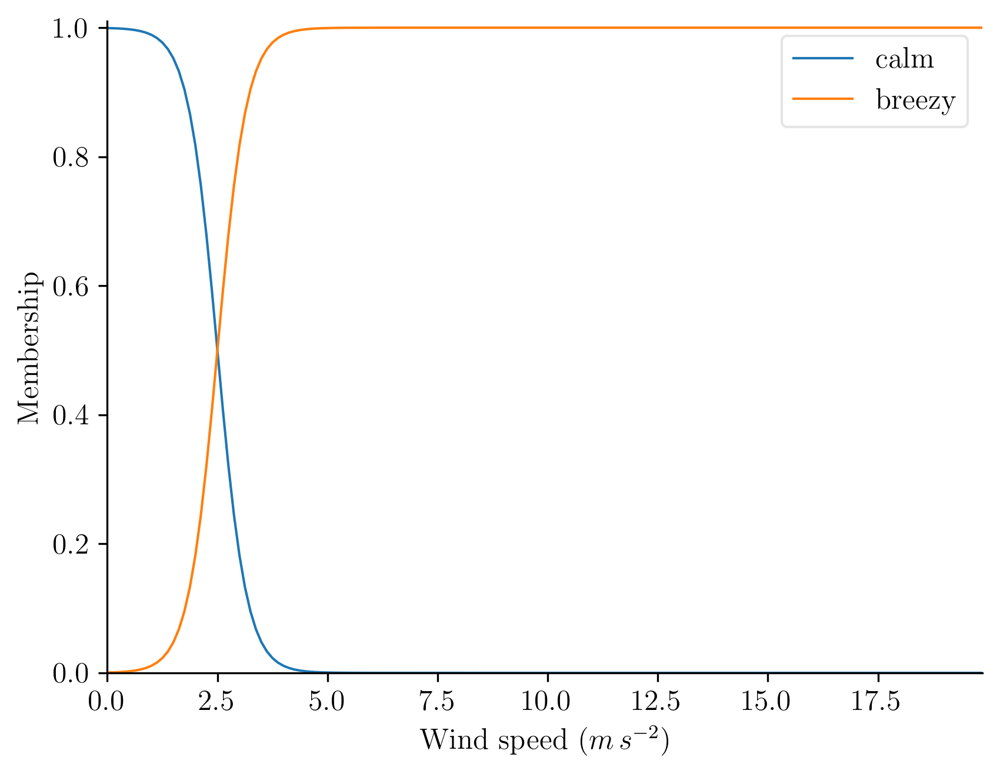

In [21]:
# Wind speed (maximum but not gust - m/s)
wind['calm'] = fuzz.sigmf(wind.universe, 2.5, -3.0)
wind['breezy'] = fuzz.sigmf(wind.universe, 2.5, 3.0)

# wind.view()
fig,ax = wind.view(figsize=(10,10), dpi=300)
ax.set_xlabel("Wind speed ($m\,s^{-2}$)")

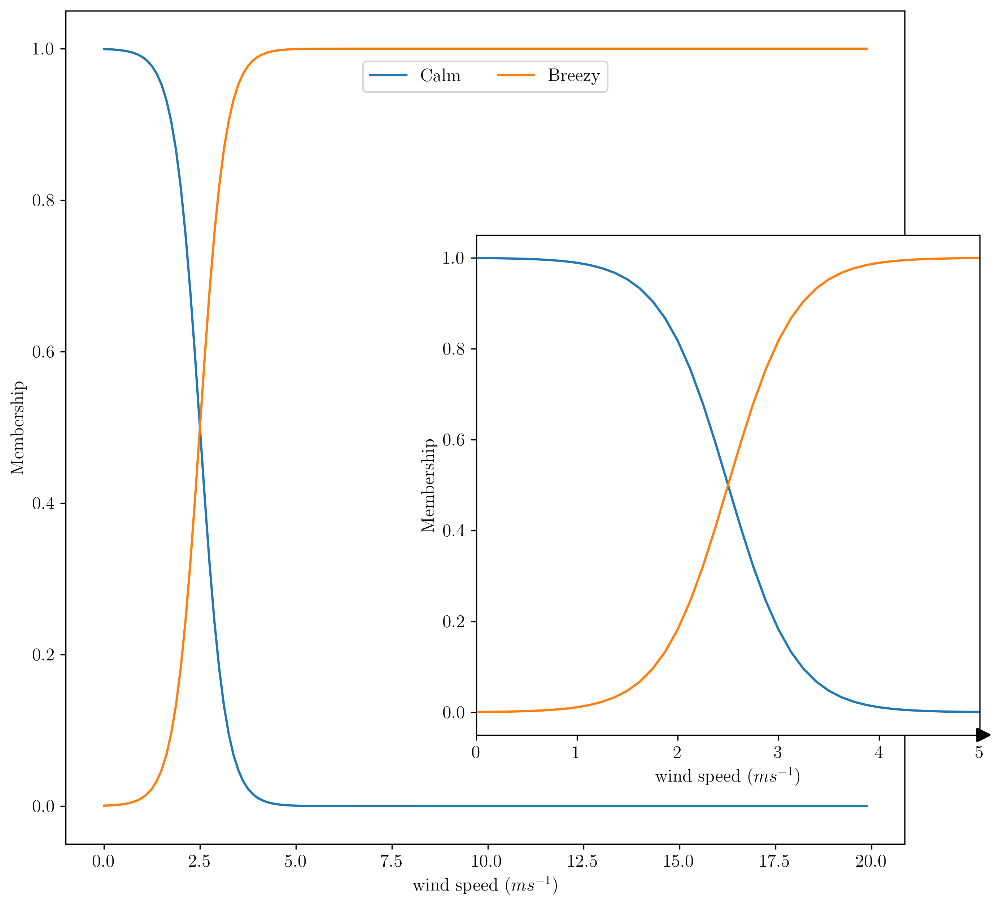

In [53]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# main plot
fig, ax_main = plt.subplots(figsize=(10, 10), dpi=300)
ax_main.plot(wind_uod, wind['calm'].mf, label='Calm')
ax_main.plot(wind_uod, wind['breezy'].mf, label='Breezy')
ax_main.set_xlabel(r"wind speed ($ms^{-1}$)")
ax_main.legend()

# Create inset plot with adjusted position and size
# Adjusting width and height to make the inset larger
# Adjusting bbox_to_anchor to move it further left and higher inside the main plot
ax_inset = inset_axes(ax_main, width="60%", height="60%", loc="lower right",
                      bbox_to_anchor=(0.1, 0.12, 1, 1), bbox_transform=ax_main.transAxes)
ax_inset.plot(wind_uod, wind['calm'].mf)
ax_inset.plot(wind_uod, wind['breezy'].mf)
ax_inset.set_xlim(0, 5)
ax_inset.set_xlabel(r"wind speed ($ms^{-1}$)")

# Adding the arrow at the end of the x-axis in the inset
ax_inset.annotate('', xy=(1.03, 0), xytext=(1.0, 0),
                  xycoords='axes fraction', textcoords='axes fraction',
                  arrowprops=dict(arrowstyle="-|>", color='k', lw=1.5, mutation_scale=20))
ax_inset.set_ylabel("Membership")
ax_main.set_ylabel("Membership")
ax_main.legend(loc='upper center', bbox_to_anchor=(0.5, 0.95), ncol=2)

plt.show()

Text(0.5, 0, 'Solar radiation ($W\\,m^{-2}$)')

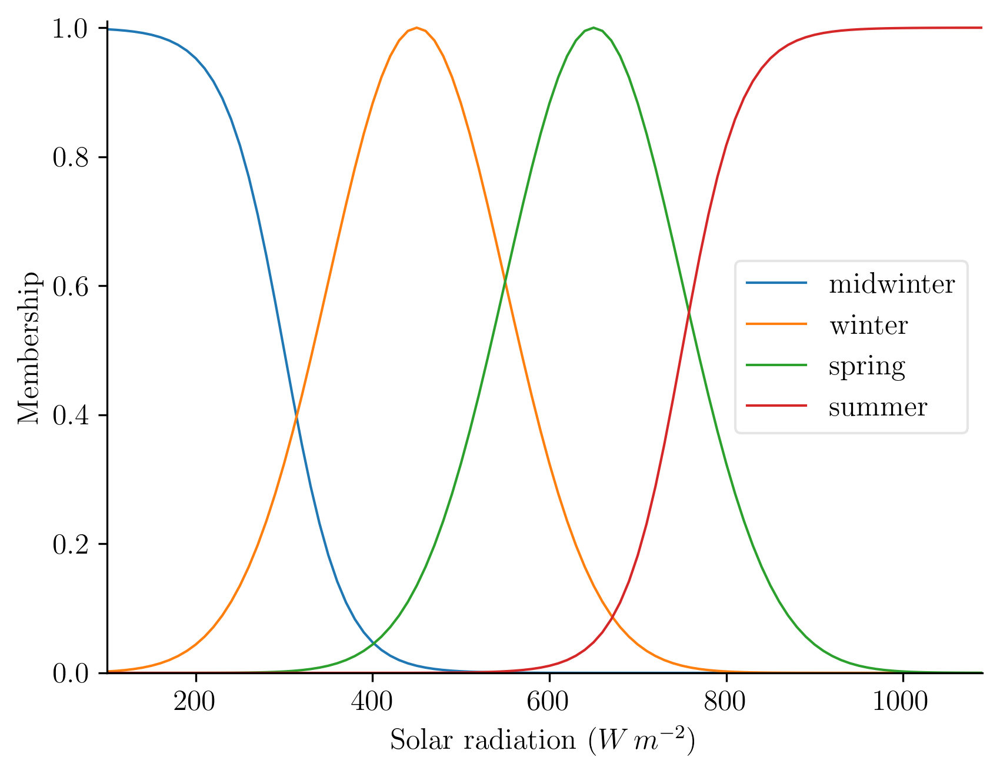

In [22]:
# 100-350 for mid-winter/cloudy and make it gaussian
# 350-550 for Feb
# 400-600 for March (spring)
# 500-900 for rest of year (ignoring)

solar['midwinter'] = fuzz.sigmf(solar.universe, 300, -0.03)
solar['winter'] = fuzz.gaussmf(solar.universe, 450, 100)
solar['spring'] = fuzz.gaussmf(solar.universe, 650, 100)
solar['summer'] = fuzz.sigmf(solar.universe, 750, 0.03)


# solar.view()
fig,ax = solar.view(figsize=(10,10), dpi=300)
ax.set_xlabel("Solar radiation ($W\,m^{-2}$)")

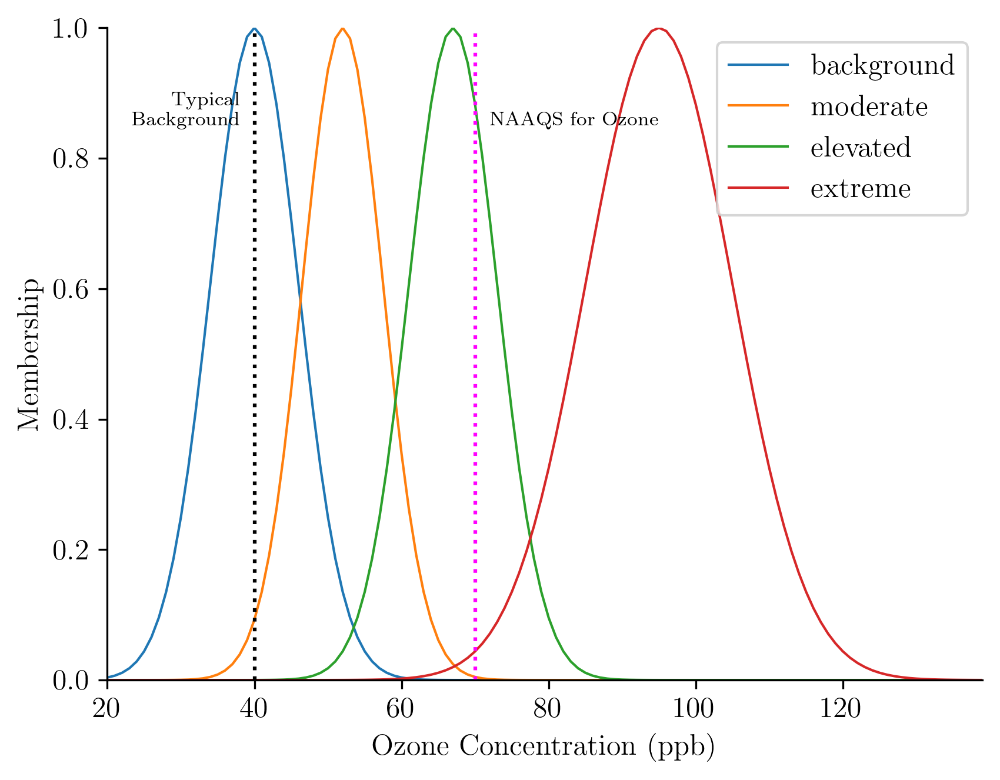

In [23]:
curve_centres = {'background':40, 'moderate':52, 'elevated':67, 'extreme':95}
sigma_vals = {'background':6, 'moderate':5.5, 'elevated':6, 'extreme':10}

ozone['background'] = fuzz.gaussmf(ozone.universe, curve_centres['background'], sigma_vals['background'])
ozone['moderate'] = fuzz.gaussmf(ozone.universe, curve_centres['moderate'], sigma_vals['moderate'])
ozone['elevated'] = fuzz.gaussmf(ozone.universe, curve_centres['elevated'], sigma_vals['elevated'])
ozone['extreme'] = fuzz.gaussmf(ozone.universe, curve_centres['extreme'], sigma_vals['extreme'])

# Plot ozone 
plot_ozone_fcst(ozone)


### Fuzzy quantities and permutations 

We have the following antecendents and their categories:
1. Snow: Negligible, Sufficient
2. Pressure: Low, Average, High
3. Wind: Calm, Breezy
4. Solar: Midwinter, Winter, Spring, Summer
5. Ozone: Background, Moderate, Elevated, Extreme

Starting with snow:
* Sufficient snow is pre-requisite for any ozone level above background

Pressure:
* Low pressure is a pre-requisite for background ozone
* High pressure is a pre-requisite for elevated/extreme ozone
* Average pressure means other ingredients may dominate - moderate ozone potentially

Wind:
* Calm wind is a pre-requisite for elevated/extreme ozone
* Breezy wind is a pre-requisite for background ozone

Solar:
* Midwinter solar radiation needs other ingredients to be very conducive for elevated ozone
* Winter solar radiation needs other ingredients to be somewhat conducive for elevated ozone
* Spring solar radiation seems to trigger some events of higher ozone levels 
* Summer solar radiation is too strong to maintain a cold pool, so is background 



### Rule base
We will code up the rules as follows:

In [24]:
# Rule 1: Catching cases where ozone cannot build
rule1 = ctrl.Rule((snow['negligible'] | mslp['low'] | wind['breezy']), ozone['background'])

# Rules: snow sufficient, pressure high, wind calm - now depends on solar insolation 
rule2 = ctrl.Rule(snow['sufficient'] & mslp['high'] & wind['calm'] & solar['spring'], ozone['extreme'])
rule3 = ctrl.Rule(snow['sufficient'] & mslp['high'] & wind['calm'] & solar['winter'], ozone['elevated']) # sun weak, but conditions good
rule4 = ctrl.Rule(snow['sufficient'] & mslp['high'] & wind['calm'] & (solar['midwinter'] | solar['summer']), ozone['moderate']) # sun weak/strong, but other conditions good 

# Another rule needed for early-season inversion with lack of storm/interruption so it builds - 2013/2014
# Memory of days into inversion or previous day etc. Build up to "steady state". Seth has draft of paper. Days into inversion?
# Correlate with NOx?! 
# What if output was inversion strength?
# This then feeds into a model using "how strong", "how long", etc to predict ozone build-up

# Could consider a rule with a single use of a new variable that "tips the balance" in a cusp or extreme case 
# Maybe soil temp/summer average, percent of max insolation, previous O3/NOx etc 

# Cusp cases
rule5 = ctrl.Rule(snow['sufficient'] & mslp['average'] & wind['calm'] & (solar['spring'] | solar['winter']), ozone['elevated']) # maybe moderate
rule6 = ctrl.Rule(snow['sufficient'] & mslp['average'] & wind['calm'] & (solar['midwinter'] | solar['summer']), ozone['moderate']) # maybe background 
# rule7 = ctrl.Rule(snow['sufficient'] & mslp['average'] & wind['calm'] & solar['summer'], ozone['moderate']) # sun strong, but conditions marginal



In [25]:
## Create control system and simulation
ozone_ctrl = ctrl.ControlSystem([rule1, rule2, rule3, rule4, rule5, rule6]) # , rule7])
ozone_simulation = ctrl.ControlSystemSimulation(ozone_ctrl)

### Example cases
We will now test the model with some example cases. We will set the input variables to some values and then compute the output. We will also plot the membership functions to see how the input values are fuzzified.

Here is an overview of three cases:
1. Cusp case: 4 inches snow, average pressure, low wind, low solar radiation
2. High ozone case: High snow, high pressure, low wind, March clear-sky solar radiation
3. Typical "background" March day: 2 inches snow, medium pressure, medium wind, high solar radiation

This results in (1) elevated, (2) high, and (3) background ozone levels.


Predicted Ozone Level: 88.72597335071164


/Users/johnlawson/UBWO-FIS/UBWO-FIS/skfuzzy/control/fuzzyvariable.py:125: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


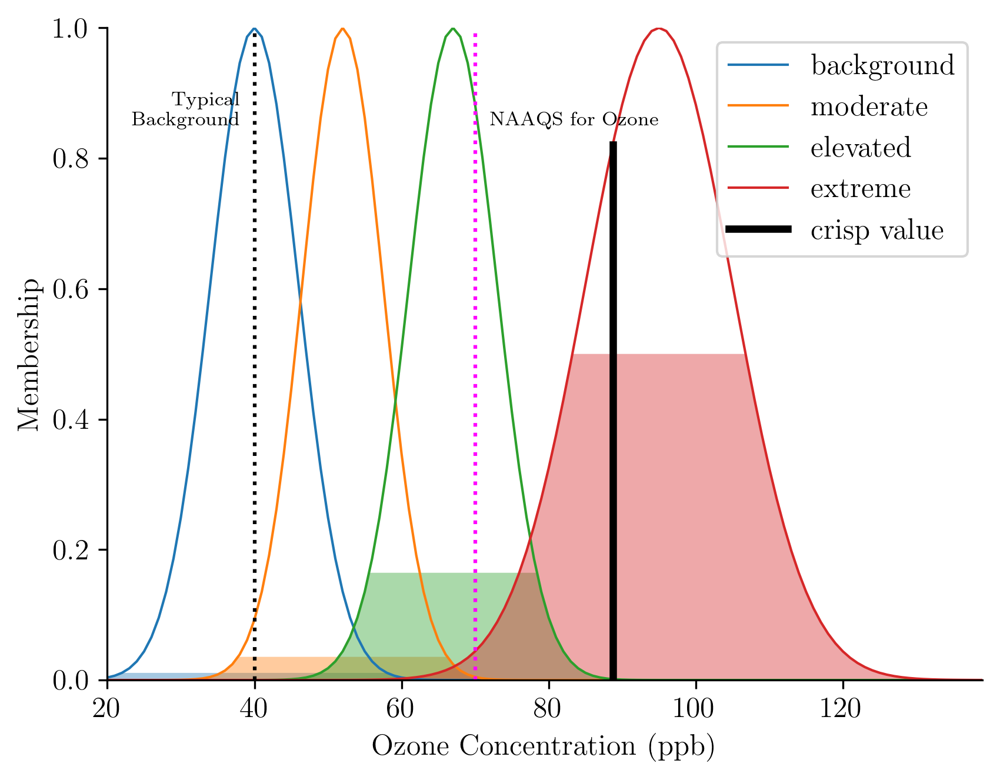

In [26]:
# EXAMPLE 1: Example inputs of "high ozone" case
ozone_simulation.input['snow'] = 250
ozone_simulation.input['mslp'] = 1045E2
ozone_simulation.input['wind'] = 1
ozone_simulation.input['solar'] = 640

ozone_simulation.compute()
print("Predicted Ozone Level:", ozone_simulation.output['ozone'])

poss_necess_df = compute_possibility_necessity_df(ozone_simulation, ozone)
plot_ozone_fcst(ozone, sim=ozone_simulation, df=poss_necess_df, category_curve_centre=curve_centres)

/Users/johnlawson/UBWO-FIS/UBWO-FIS/skfuzzy/control/fuzzyvariable.py:125: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Predicted Ozone Level: 40.66583138288643


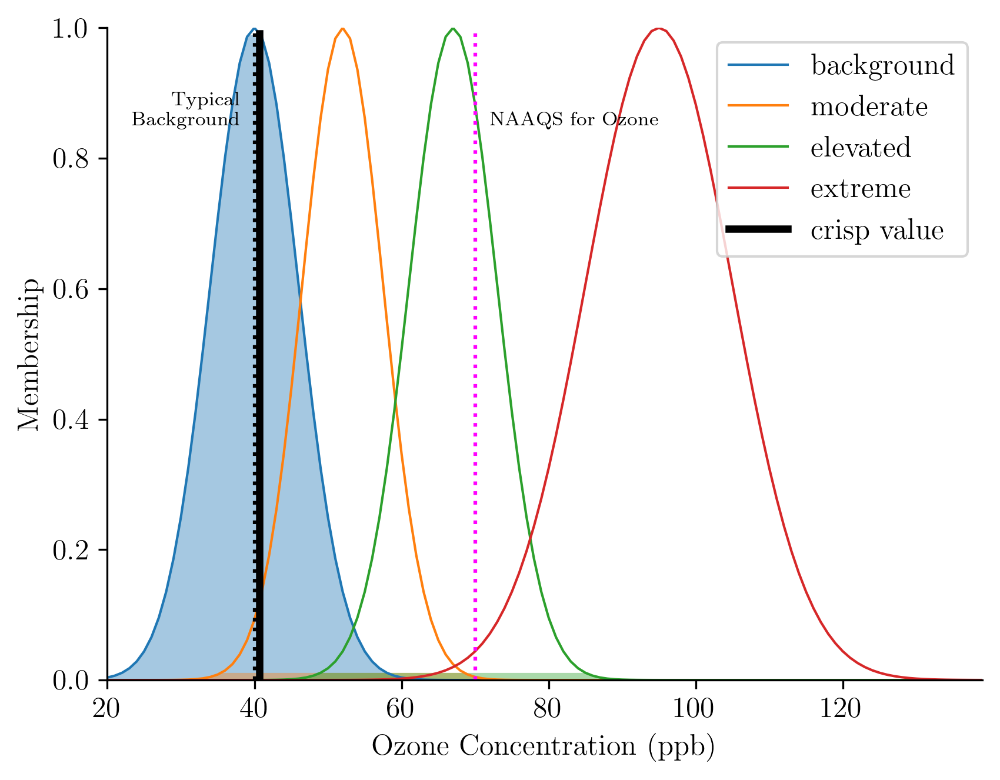

In [27]:
# EXAMPLE 2: Example inputs of "winter, background day" case - a bit breezy
ozone_simulation.input['snow'] = 50
ozone_simulation.input['mslp'] = 1025E2
ozone_simulation.input['wind'] = 4
ozone_simulation.input['solar'] = 600

ozone_simulation.compute()
print("Predicted Ozone Level:", ozone_simulation.output['ozone'])

# ozone.view(sim=ozone_simulation)
poss_necess_df = compute_possibility_necessity_df(ozone_simulation, ozone)
plot_ozone_fcst(ozone, sim=ozone_simulation, df=poss_necess_df, category_curve_centre=curve_centres)

In [28]:
# EXAMPLE 3: Example inputs of "cusp" case + other function/insight
ozone_simulation.input['snow'] = 100
ozone_simulation.input['mslp'] = 1040E2
ozone_simulation.input['wind'] = 1.5
ozone_simulation.input['solar'] = 500

ozone_simulation.compute()
print("Predicted Ozone Level:", ozone_simulation.output['ozone'])


Predicted Ozone Level: 68.34209067989907


In [29]:
# More information about the output
ozone_simulation.print_state()

 Antecedents 
Antecedent: snow                    = 100
  - negligible                      : 0.10909682119561293
  - sufficient                      : 0.5
Antecedent: mslp                    = 104000.0
  - low                             : 1.3709572068578448e-06
  - average                         : 0.3885581275123641
  - high                            : 0.07585818002124355
Antecedent: wind                    = 1.5
  - calm                            : 0.9525741268224334
  - breezy                          : 0.04742587317756678
Antecedent: solar                   = 500
  - midwinter                       : 0.0024726231566347743
  - winter                          : 0.8824969025845955
  - spring                          : 0.32465246735834974
  - summer                          : 0.0005527786369235996

 Rules 
RULE #0:
  IF (snow[negligible] OR mslp[low]) OR wind[breezy] THEN ozone[background]
	AND aggregation function : fmin
	OR aggregation function  : fmax

  Aggregation (IF-clause):

In [30]:
# Showing example of possibility and necessity dataframe

# possibility_array = np.array([k.membership_value[ozone_simulation] for k in ozone.terms.values()])
# necessity_array = compute_necessity_distr(possibility_array, func="max")
# poss_necess_df = create_dataframe_poss_necess(ozone.terms.keys(), possibility_array, necessity_array)
poss_necess_df = compute_possibility_necessity_df(ozone_simulation, ozone)

poss_necess_df

,possibility,necessity
background,0.109097,0.611442
moderate,0.002473,0.611442
elevated,0.388558,0.890903
extreme,0.075858,0.611442


/Users/johnlawson/UBWO-FIS/UBWO-FIS/skfuzzy/control/fuzzyvariable.py:125: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


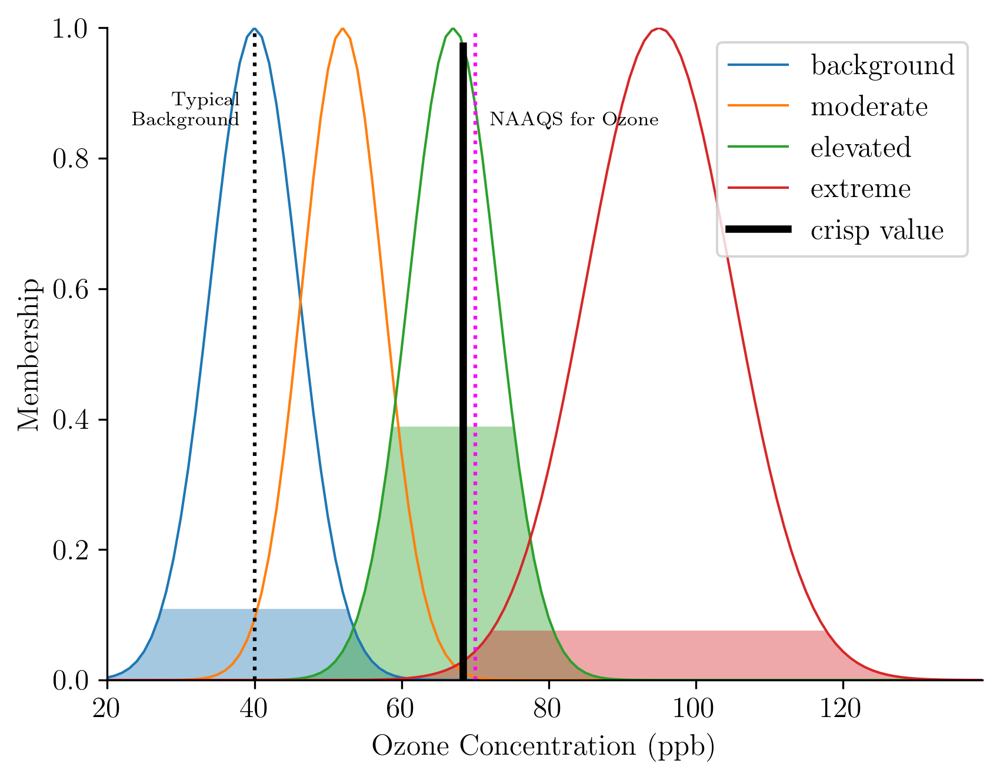

In [31]:
# ozone.view(sim=ozone_simulation)
# TODO: need to plot a rescaled version when we use necessity
plot_ozone_fcst(ozone, sim=ozone_simulation, df=poss_necess_df, category_curve_centre=curve_centres)

# Could do custom plot now we have two distribution arrays!

# TODO: see how the "other" category would cover about 40pc of the 'mass' in Dempster-Shafer theory
# Sign of how good the rule coverage, albeit not how well it predicts the system.

/Users/johnlawson/UBWO-FIS/UBWO-FIS/skfuzzy/control/fuzzyvariable.py:125: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Predicted Ozone Level: 44.90150042730318


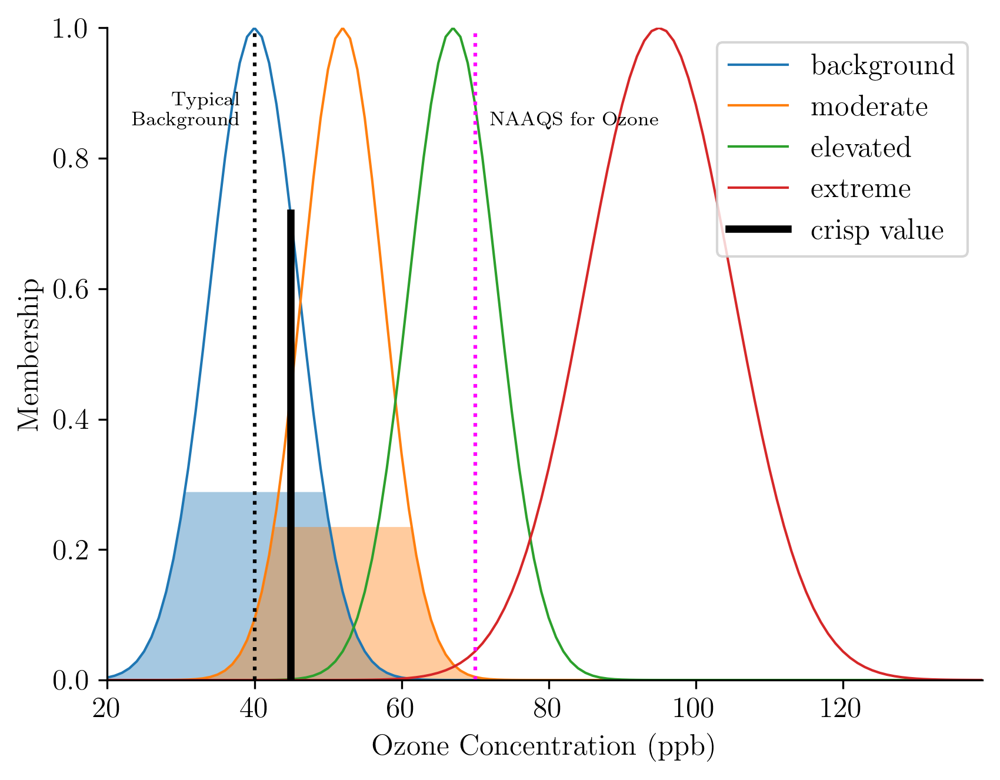

In [32]:
# EXAMPLE 4: Example inputs of snowy, calm, summer day
# This should confuse Clyfar due to contradictory inputs 
ozone_simulation.input['snow'] = 83
ozone_simulation.input['mslp'] = 1050E2
ozone_simulation.input['wind'] = 1.0
ozone_simulation.input['solar'] = 1100

# Plus - anything outside the universe of discourse will be clipped to the limits

ozone_simulation.compute()
print("Predicted Ozone Level:", ozone_simulation.output['ozone'])

# For each input, determine the activation
# SNOW
# snow_level_lo = fuzz.interp_membership(snow.universe, snow['negligible'], 100)
# snow_level_lo

# ozone.view(sim=ozone_simulation)
poss_necess_df = compute_possibility_necessity_df(ozone_simulation, ozone)

plot_ozone_fcst(ozone, sim=ozone_simulation, df=poss_necess_df, category_curve_centre=curve_centres)

# TODO instead of necessity, look at size of "other" mass, which is 45pc fpr this 
# i.e. (most scenarios in this model system occurs outside ruleset)


### Using 2022/2023 winter data to evaluate the model

In [33]:
# Load pickled data "df_rep.pkl"
df_rep = pd.read_pickle(f"../local_data/df_rep_{y}.pkl")
df_rep

,snow_depth,ozone_concentration,sea_level_pressure,wind_speed,solar_radiation
2021-12-01 00:00:00-07:00,0.0,40.000,103022.3300,2.058,419.448529
2021-12-02 00:00:00-07:00,0.0,43.280,102633.9625,1.543,421.065000
2021-12-03 00:00:00-07:00,0.0,44.295,102535.5875,1.543,421.048529
2021-12-04 00:00:00-07:00,0.0,44.315,102492.1525,1.543,424.917941
2021-12-05 00:00:00-07:00,0.0,39.880,101888.8650,2.058,410.885000
...,...,...,...,...,...
2022-03-27 00:00:00-06:00,0.0,49.830,100648.3475,2.058,708.440000
2022-03-28 00:00:00-06:00,0.0,47.000,100581.5250,2.572,415.900000
2022-03-29 00:00:00-06:00,0.0,42.780,100378.9725,2.058,171.500000
2022-03-30 00:00:00-06:00,0.0,51.000,101117.4325,2.572,702.800000


In [34]:
# We want to compute a forecast ozone_concentration using our FIS 
# Then compare forecast time series to observed for the winter 
# We can create forecasts using the ozone_simulation and feeding in values from df_rep
# We can put forecasts in a new column called "ozone_forecast" in the df_rep dataframe
do_normalize = False

ozone_categories = ['background', 'moderate', 'elevated', 'extreme']

# Initialize columns for forecast and possibility values
columns_to_initialize = ['ozone_forecast'] + [f'possibility_{cat}' for cat in ozone_categories]
if do_normalize:
    [f'possibility_{cat}_norm' for cat in ozone_categories]

# Create new columns with NaN values
for col in columns_to_initialize:
    df_rep[col] = np.nan

# Loop through each row in the dataframe
# The columns are called snow_level, sea_level_pressure, wind_speed, and solar_radiation
for i, row in df_rep.iterrows():
    # Set the input values
    ozone_simulation.input['snow'] = row['snow_depth']
    ozone_simulation.input['mslp'] = row['sea_level_pressure']
    ozone_simulation.input['wind'] = row['wind_speed']
    ozone_simulation.input['solar'] = row['solar_radiation']

    # Compute the output
    ozone_simulation.compute()

    # Set the forecast value in the dataframe
    # Let's put in the 0.25 and 0.75 quantile of the centroid output 
    val = ozone_simulation
    df_rep.at[i, 'ozone_forecast'] = ozone_simulation.output['ozone']
    # df_rep.at[i, ]
    
    # Store the possibility per category for this time (background, elevated, high, extreme)
    for k,v in ozone.terms.items():
        df_rep.at[i, f'possibility_{k}'] = v.membership_value[ozone_simulation]

    if do_normalize:
        # Normalize the raw (un-normalized) possibility values for row to ensure sup(possibility) = 1
        # Put these values into the columns with the _norm suffix
        possibility_array = df_rep.loc[i, [f'possibility_{cat}' for cat in ozone_categories]].values
        possibility_array_norm = do_normalization(possibility_array)
        # print(possibility_array)
        # print(possibility_array_norm)
        for cat in ozone_categories:
            df_rep.at[i, f'possibility_{cat}_norm'] = possibility_array_norm[ozone_categories.index(cat)]
        # assert 1==0
df_rep


,snow_depth,ozone_concentration,sea_level_pressure,wind_speed,solar_radiation,ozone_forecast,possibility_background,possibility_moderate,possibility_elevated,possibility_extreme
2021-12-01 00:00:00-07:00,0.0,40.000,103022.3300,2.058,419.448529,40.204958,0.992608,0.000911,0.000911,6.228465e-04
2021-12-02 00:00:00-07:00,0.0,43.280,102633.9625,1.543,421.065000,40.091138,0.992608,0.000911,0.000911,8.928449e-05
2021-12-03 00:00:00-07:00,0.0,44.295,102535.5875,1.543,421.048529,40.083198,0.992608,0.000911,0.000911,5.457474e-05
2021-12-04 00:00:00-07:00,0.0,44.315,102492.1525,1.543,424.917941,40.080723,0.992608,0.000911,0.000911,4.382184e-05
2021-12-05 00:00:00-07:00,0.0,39.880,101888.8650,2.058,410.885000,40.071355,0.992608,0.000911,0.000911,2.148979e-06
...,...,...,...,...,...,...,...,...,...,...
2022-03-27 00:00:00-06:00,0.0,49.830,100648.3475,2.058,708.440000,40.070903,0.992608,0.000911,0.000911,4.331563e-09
2022-03-28 00:00:00-06:00,0.0,47.000,100581.5250,2.572,415.900000,40.070903,0.992608,0.000911,0.000911,3.120517e-09
2022-03-29 00:00:00-06:00,0.0,42.780,100378.9725,2.058,171.500000,40.070902,0.992608,0.000911,0.000911,1.133857e-09
2022-03-30 00:00:00-06:00,0.0,51.000,101117.4325,2.572,702.800000,40.070911,0.992608,0.000911,0.000911,4.549897e-08


In [35]:
# Let's compute the percentile of each category's possibility in the climatology
# Only include the index (datetime) and the four possibility columns
df_percentiles = df_rep[['possibility_background', 'possibility_moderate', 'possibility_elevated',
                            'possibility_extreme']]

# Compute the percentiles
percentiles = df_percentiles.rank(pct=True)
percentiles

,possibility_background,possibility_moderate,possibility_elevated,possibility_extreme
2021-12-01 00:00:00-07:00,0.830579,0.152893,0.152893,0.719008
2021-12-02 00:00:00-07:00,0.830579,0.152893,0.152893,0.611570
2021-12-03 00:00:00-07:00,0.830579,0.152893,0.152893,0.578512
2021-12-04 00:00:00-07:00,0.830579,0.152893,0.152893,0.570248
2021-12-05 00:00:00-07:00,0.830579,0.152893,0.152893,0.330579
...,...,...,...,...
2022-03-27 00:00:00-06:00,0.830579,0.152893,0.152893,0.066116
2022-03-28 00:00:00-06:00,0.830579,0.152893,0.152893,0.049587
2022-03-29 00:00:00-06:00,0.830579,0.152893,0.152893,0.016529
2022-03-30 00:00:00-06:00,0.830579,0.152893,0.152893,0.181818


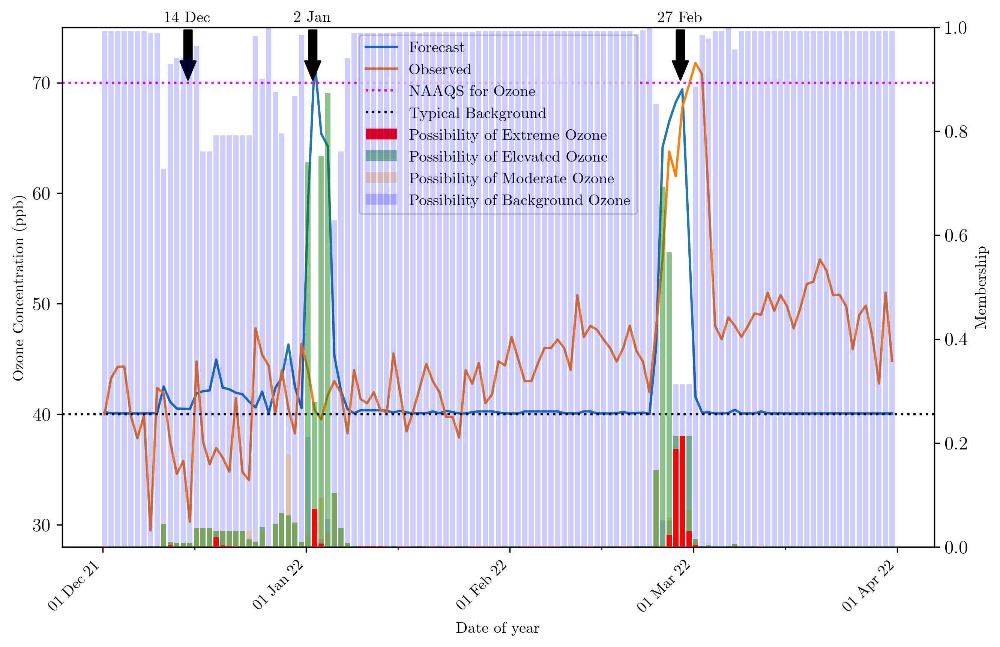

In [36]:
import matplotlib.pyplot as plt
import pandas as pd

# Create the figure and the first axis
fig, ax1 = plt.subplots(figsize=(10, 6), dpi=300)

# Plot the forecast and observed ozone concentration on the first axis
ax1.plot(df_rep['ozone_forecast'], label='Forecast')
ax1.plot(df_rep['ozone_concentration'], label='Observed')

# Add horizontal lines for NAAQS limit and typical background
ax1.axhline(y=70, color='magenta', linestyle=':', linewidth=1.5, label='NAAQS for Ozone', zorder=2)
ax1.axhline(y=40, color='k', linestyle=':', linewidth=1.5, label='Typical Background', zorder=2)

# Set the first axis labels and limits
ax1.set_ylabel('Ozone Concentration (ppb)', fontsize=10)
ax1.set_xlabel('Date of year', fontsize=10)
ax1.set_ylim(28, 75)
# ax1.legend(loc='center left', fontsize=10)

# Create the second y-axis and plot the bars
ax2 = ax1.twinx()
ax2.bar(df_rep.index, df_rep['possibility_extreme'], color='red', alpha=0.99, label='Possibility of Extreme Ozone', zorder=4)
ax2.bar(df_rep.index, df_rep['possibility_elevated'], color='green', alpha=0.45, label='Possibility of Elevated Ozone', zorder=3)
ax2.bar(df_rep.index, df_rep['possibility_moderate'], color='orange', alpha=0.3, label='Possibility of Moderate Ozone', zorder=2)
ax2.bar(df_rep.index, df_rep['possibility_background'], color='blue', alpha=0.2, label='Possibility of Background Ozone', zorder=1)

# Set the second axis labels and limits
ax2.set_ylabel('Membership', fontsize=10)
ax2.set_ylim(0, 1)

# Add thick black lines with solid arrows for specific dates
dates = ['2022-02-27', '2022-01-02', '2021-12-14']
date_labels = ['27 Feb', '2 Jan', '14 Dec']
for date, label in zip(dates, date_labels):
    date_timestamp = pd.Timestamp(date)
    ax1.annotate('', xy=(date_timestamp, 70), xytext=(date_timestamp, 75),
                 arrowprops=dict(facecolor='black', shrink=0.05, width=5, headwidth=10))
    ax1.text(date_timestamp, 75.5, label, ha='center', fontsize=10)

# Add legends for both axes
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper center', fontsize=10, facecolor='white')

# Set x-axis labels as "XX mmm YY" 
# XX is the day, mmm is the 3-letter abbreviated months, and YY is the last two digits of year 
# Set x-axis labels as "XX mmm YY" with appropriate spacing
ax1.xaxis.set_major_locator(mdates.MonthLocator())
ax1.xaxis.set_minor_locator(mdates.DayLocator(bymonthday=(1, 15)))
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%d %b %y'))

# Rotate the x-axis labels for better readability
plt.setp(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=10)

plt.grid(False, which='both')

# Display the plot
plt.show()

In [37]:
# The two peaks of ozone forecast (around 1 Jan and 1 March) have substantial error.
# I'd like to see which rules are being activated to see what is dominating the forecast
# There is snow but sun isn't super strong.


In [38]:
# Create a dictionary of approximate ranges for each "ozone concentration level" category
range_dict = range_from_gaussian_params(curve_centres, sigma_vals)

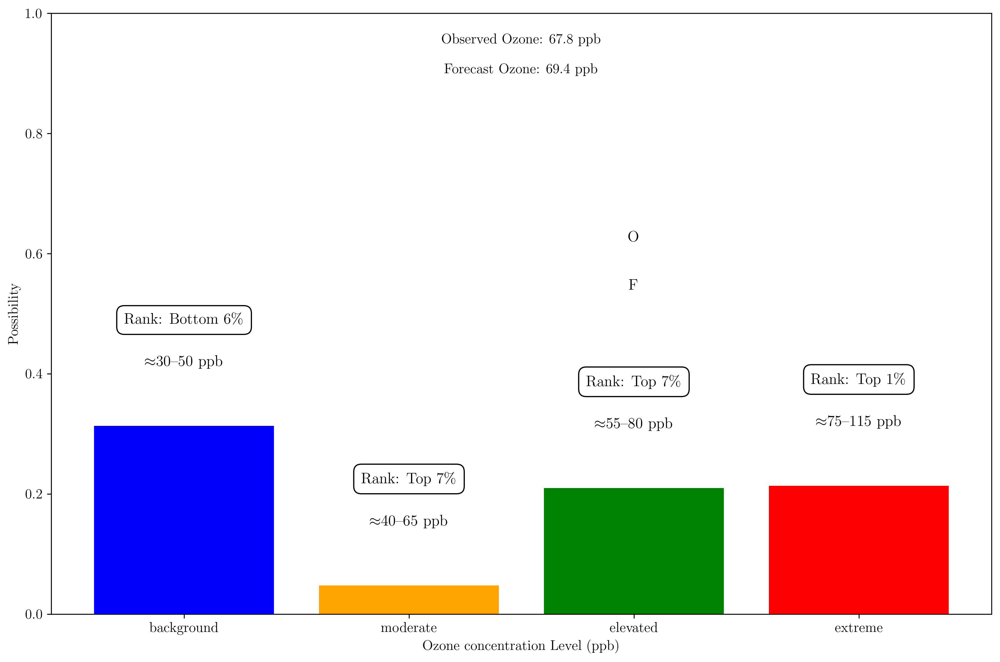

In [39]:
month = 'Feb' 
day = 27
year = maybe_amend_year(month,y)

# Generate a dictionary of percentile values for each category for this day
pc_dict = {k: percentiles.loc[f'{year}-{month}-{day}'][k] for k in percentiles.columns}

plot_possibility_necessity(df_rep, ozone, month=month, day=day, range_dict=range_dict,
                            range_str_dict=generate_str_from_range(range_dict),
                            percentiles=pc_dict)

# With the information below, you would likely rule out background but distribution makes it difficult to trust crisp value

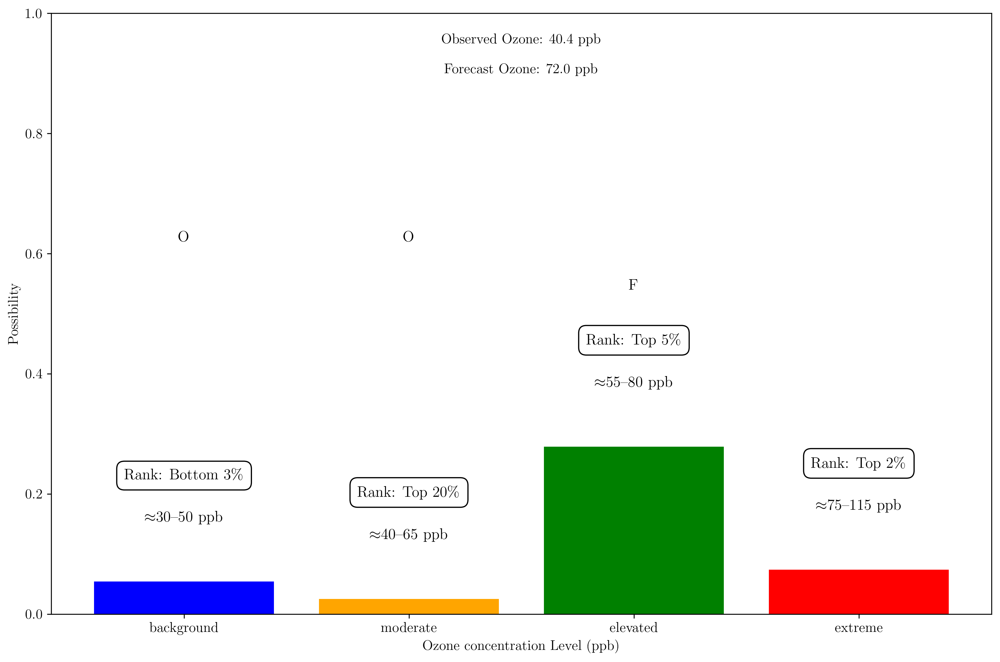

In [40]:
month = 'Jan'
day = 2
year = maybe_amend_year(month,y)

# Generate a dictionary of percentile values for each category for this day
pc_dict = {k: percentiles.loc[f'{year}-{month}-{day}'][k] for k in percentiles.columns}

plot_possibility_necessity(df_rep, ozone, month=month, day=day, range_dict=range_dict,
                            range_str_dict=generate_str_from_range(range_dict),
                           percentiles=pc_dict)

# Note how "extreme" can be notable even with low possibility, because it's a rare event
# Clyfar leaves scope for really high-end values but not via centroid - via e.g. 90th percentile of aggregated distribution

In [41]:
# If we enforce N <= PI, then we might show necessity as a fill of the bar 

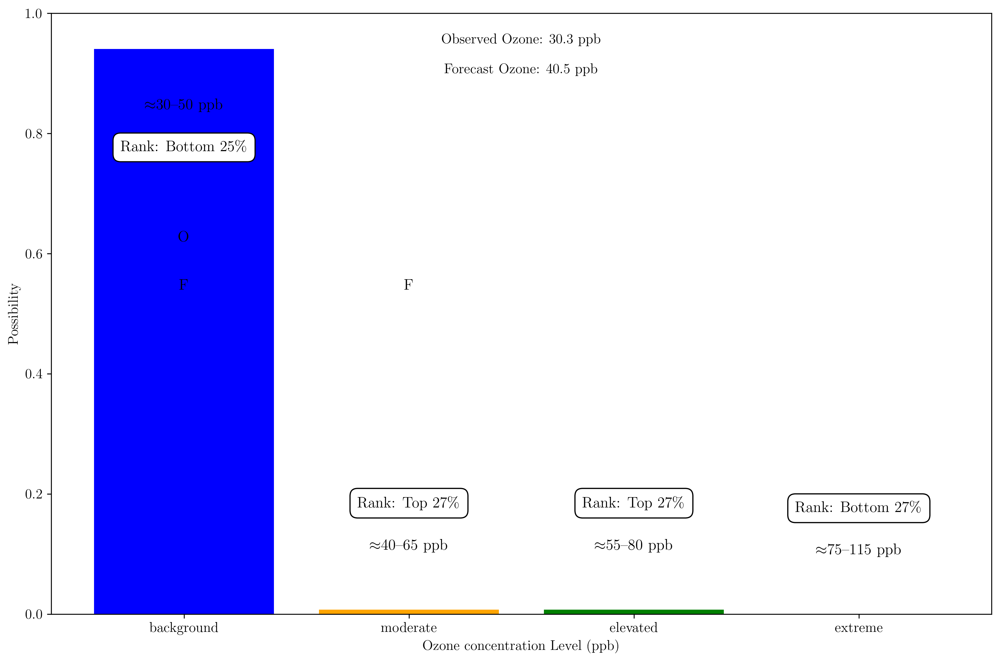

In [42]:
month = 'Dec'
day = 14
year = maybe_amend_year(month,y)

# Generate a dictionary of percentile values for each category for this day
pc_dict = {k: percentiles.loc[f'{year}-{month}-{day}'][k] for k in percentiles.columns}

plot_possibility_necessity(df_rep, ozone, month=month, day=day, range_dict=range_dict,
                            range_str_dict=generate_str_from_range(range_dict),
                           percentiles=pc_dict)

# Note that observed ozone is very low - so ozone is consumed by NOx 

# TODO - see how "other" still has a small mass (~0.04) in the Dempster-Shafer theory terms; "other" takes residual of 1 - (total_possibility)

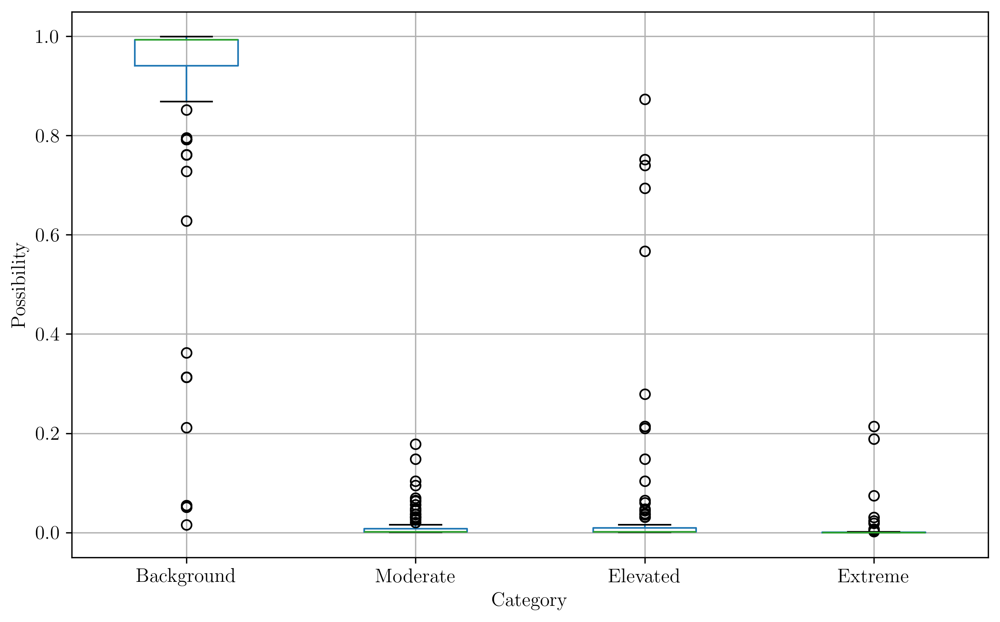

In [43]:
# Plot distribution of each category's possibility in df_rep
# Do with box-and-whisker, but could consider, e.g., histogram or cdf 

fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=300)

column_names = [
    'Background', 'Moderate', 'Elevated', 'Extreme']

# Plot the distribution of each category's possibility
# Use a box-and-whisker where the x axis is the category (string), and the y axis is the possibility (0-1)
# Use column_names as column titles, not the dataframe column names
df_rep.boxplot(column=['possibility_background', 'possibility_moderate', 'possibility_elevated', 'possibility_extreme'], ax=ax)
 
ax.set_xticklabels(column_names)
ax.set_xlabel("Category")
ax.set_ylabel("Possibility")
plt.show()



There's a problem here with, e.g., background being triggered more often because it's common, not rare.
Do we consider showing anomalies in the historical data average/range?

In [44]:
df_rep['possibility_background'].unique()

array([0.99260846, 0.98947422, 0.98945667, 0.72799956, 0.92931874,
       0.94055284, 0.96416076, 0.76116268, 0.79235845, 0.98337061,
       0.90129197, 0.99832053, 0.87629737, 0.79577785, 0.36206195,
       0.86828732, 0.98576692, 0.21149953, 0.05434743, 0.01533176,
       0.62826739, 0.98945448, 0.99103734, 0.99259289, 0.99260534,
       0.99260379, 0.9926069 , 0.98726128, 0.99430978, 0.99963807,
       0.85199953, 0.0516102 , 0.31322992, 0.88591753, 0.98500734,
       0.97872667, 0.95761009])

In [45]:
# NOT DOING NECESSITY OR POSSIBILITY NORMALIZATION NOW 
# plot_ozone_permutations()

|The issue is the case where a given category like elevated has low possibility, but there are one versus two highly possibility other categories. In the (d) panel, the necessity of elevated is higher if we use the complement of a mean of the two non-elevate possibilities, instead of the complement of a maximum. This is a more ? approach to uncertainty, and is ? useful for the Winter Ozone Alert program. Does the entropy of the possibility distribution give us indication of whether we consider necessity of elevated ozone the complement of mean, max, etc combination of other possibilities?

In [46]:
# To explore "rule space", we can run a Genetic Algorithm to find the best ruleset
# The fitness of the ruleset can be saved to evaluate/explain the ruleset configuration
# Fitness function can be (1) RMSE of centroid of output distribution, (2) information gain of possibility distribution
# Also, we can consider a way to use ML or algorithm to optimise membership function parameters
# Ultimately, this creates a more explainable AI model. This sets a baseline to beat with a neural network model.

## Optimisation via Genetic Algorithms
To explore "rule space", we can run a Genetic Algorithm to find the best ruleset. The fitness of the ruleset can be saved to evaluate/explain the ruleset configuration. Fitness function can be:
 
1. RMSE of centroid of output distribution, 
2. Ranked information gain of the possibility distribution (calibration v resolution?)

Also, we can consider a way to use ML or algorithm to optimise membership function parameters.

Ultimately, this creates a more explainable AI model. This sets a baseline to beat with a neural network model. This paper sets a blueprint for the future of Clyfar in the Uinta Basin.

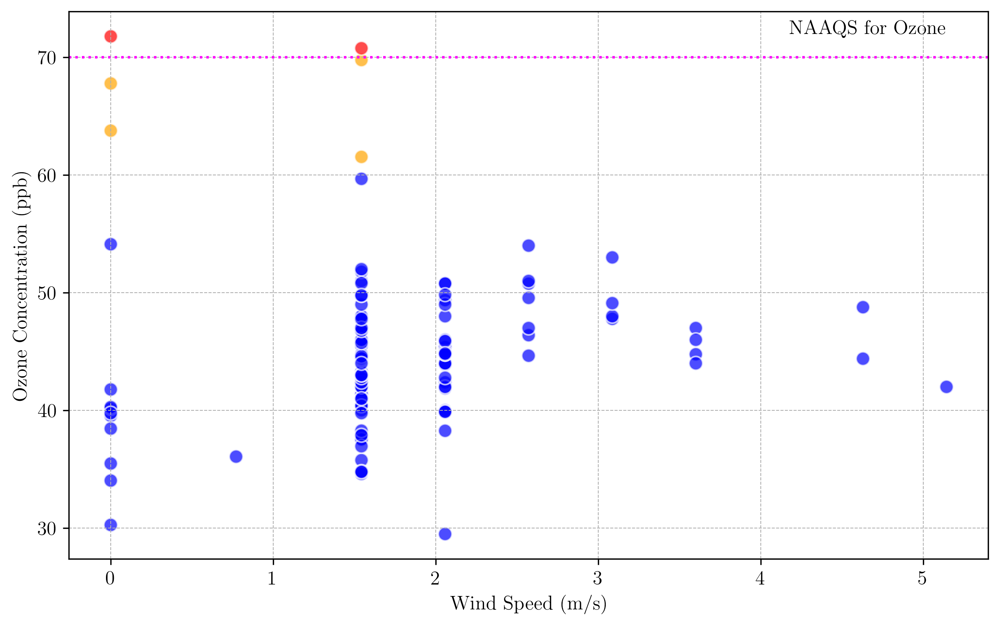

In [47]:

# Create figure to show how ozone correlates with each input variable in the climatology of representative obs (df_rep)
# For each input variable, show a scatter plot of the input variable against the ozone concentration

# Plot 1: ozone against snow depth for all rows
plt.figure(figsize=(10, 6), dpi=300)

# Define colors based on conditions
colors = df_rep['ozone_concentration'].apply(lambda x: 'red' if x > 70 else 'orange' if x >= 60 else 'blue')

plt.scatter(df_rep['wind_speed'], df_rep['ozone_concentration'], c=colors, edgecolor='w', s=70, alpha=0.7)

plt.xlabel('Wind Speed (m/s)', fontsize=12)
plt.ylabel('Ozone Concentration (ppb)', fontsize=12)

# Horizontal dotted line for NAAQS limit
plt.axhline(y=70, color='magenta', linestyle=':', linewidth=1.5)

# Add annotation for NAAQS limit
plt.annotate('NAAQS for Ozone', xy=(max(df_rep['wind_speed']), 72), fontsize=12, color='black', ha='right')

# Add grid lines
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Show plot
plt.show()

# KVEL: quantised to 0.5 m/s hence the scatter

In [48]:
### EXTRA OPTIONAL THINGS 
# If you wanted to normalise possibility you can generate necessity


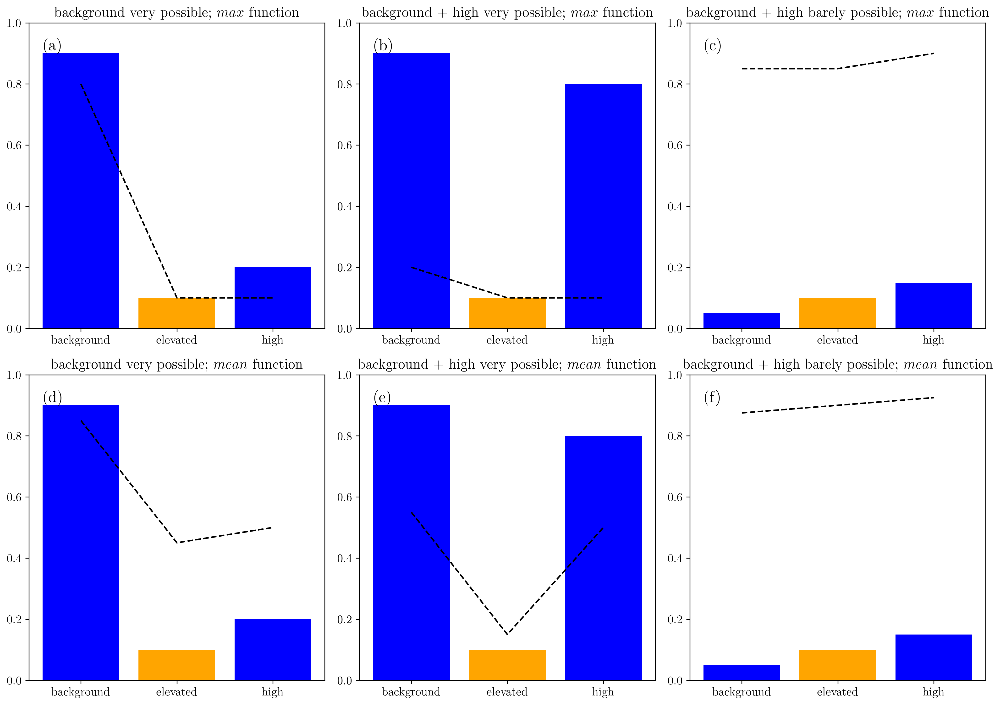

In [49]:

categories = ['background', 'elevated', 'high']

# Function for computing necessity
def compute_necessity_distr(possibility_distr, func="max"):
    if func == "max":
        f = np.max
    elif func == "mean":
        f = np.mean
    else:
        raise ValueError("func must be 'max' or 'mean'")
    
    ndf = []
    n_categories = len(possibility_distr)
    for i in range(n_categories):
        other_possibilities = [possibility_distr[j] for j in range(n_categories) if j != i]
        ndf.append(1 - f(other_possibilities))
    
    return ndf

# Function for creating plots
def create_plot(ax, PI_dist, func, title, categories):
    n_dist = compute_necessity_distr(PI_dist, func)
    ax.bar(categories, PI_dist, color=['blue', 'orange', 'blue'])
    ax.plot(categories, n_dist, color='black', linestyle='--')
    ax.set_title(title)
    ax.set_ylim(0, 1)

# Define the possibility distributions and titles for each subplot
PI_distributions = [
    (np.array([0.9, 0.1, 0.2]), "background very possible; $max$ function"),
    (np.array([0.9, 0.1, 0.8]), "background + high very possible; $max$ function"),
    (np.array([0.05, 0.1, 0.15]), "background + high barely possible; $max$ function"),
    (np.array([0.9, 0.1, 0.2]), "background very possible; $mean$ function"),
    (np.array([0.9, 0.1, 0.8]), "background + high very possible; $mean$ function"),
    (np.array([0.05, 0.1, 0.15]), "background + high barely possible; $mean$ function")
]

# Function types for each row of plots
func_types = ["max", "max", "max", "mean", "mean", "mean"]

fig, ax = plt.subplots(2, 3, figsize=(14, 10), dpi=300)

# Loop through each subplot and create the corresponding plot
for i, (PI_dist, title) in enumerate(PI_distributions):
    row, col = divmod(i, 3)
    create_plot(ax[row, col], PI_dist, func_types[i], title, categories)
    ax[row, col].text(0.05, 0.95, f'({chr(97 + i)})', transform=ax[row, col].transAxes, fontsize=16, va='top')

plt.tight_layout()
plt.show()